# Data exploration on PAMI 2019 interim dataset
In this notebook are shown the main features of the dataset and the distribution of the data fot the PAMI dataset from emotic. The generated interim dataset from the raw data will be used to perform the data exploration, as in this format it will be easier to compute the necessary operations.

First I will import the necessary libraries and load the dataset and see an example of the data and its general annotations. Afterwards, I will perform a data sanity check to avoid having issues latter on. Then I will see the distribution of the data in the dataset and the distribution of the annotations in general. Finally, I will analyze it in more detail for each data split given and for each original db. Here is the main schematic of the data exploration:
* 0. Interim data loading
* 1. Data sanity check
* 2. Data exploration over all data
* 3. Data exploration over each split
* 4. Data exploration over each original db
* 5. Conclusions

**Note**: For visualizations I used *blue* to denote quantities or counts, *red* to show ratios and *orange* to show probabilities or normalized values*

# 0.Interim data loading
First I will load the libraries needed and set some debugging variables:

In [1]:
import pandas as pd
from pathlib import Path
import os
import itertools
import collections
from prettytable import PrettyTable
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import math
import random

random.seed(33)

import altair as alt
alt.data_transformers.disable_max_rows() # delete the upper bound of entries in altair
alt.renderers.enable("html") # enable altair to render in html
# Suppress AltairDeprecationWarning warnings
import warnings
from altair.utils.deprecation import AltairDeprecationWarning
warnings.filterwarnings("ignore", category=AltairDeprecationWarning)

from src import INTERIM_DATA_DIR, INTERIM_COLUMNS
from src.visualization.display_annot import display_img_annot, display_img_set

show_execution_iterations = False


DLIB has CUDA support: True


Now I will load the interim data and check the archives found in the folder. I expect to have three archives: `train.pkl`, `test.pkl` and `validation.pkl`, corresponding to the train, test and validation sets respectively given by the raw data annotations. 

In [2]:
annotations_path = Path(os.path.join(INTERIM_DATA_DIR, 'annotations'))

annotations = {}
for data_split in os.listdir(annotations_path):
    if data_split.endswith('.pkl'):
        file = os.path.join(annotations_path, data_split)
        data_part_name = data_split.split('.')[0]
        annotations[data_part_name] = pd.read_pickle(file)
print("The annotations found are for the datasplits:", list(annotations.keys()))

The annotations found are for the datasplits: ['test', 'train', 'val']


I will order the data splits into the following structure: train, validation and test.


In [3]:
# Sort the dictionary based on the order_list
desired_datasplit_order = ['train', 'val', 'test']
annotations = dict(sorted(annotations.items(), key=lambda x: desired_datasplit_order.index(x[0])))
print("The annotations order:", list(annotations.keys()))

The annotations order: ['train', 'val', 'test']


The available databases are:

In [4]:
databases = []
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        orig_db = sample['orig_db']
        if orig_db not in databases:
            databases.append(orig_db)
databases.sort()
print("The avaliable databases are: ", databases)

The avaliable databases are:  ['ade20k', 'emodb_small', 'framesdb', 'mscoco']


The standard column format for all annotations is:

In [5]:
print("Standard column format:", INTERIM_COLUMNS)

Standard column format: ['path', 'orig_db', 'img_size', 'people', 'bbox', 'label_cat', 'label_cont', 'gender', 'age']


And here it can be seen the first rows of the train set:

In [6]:
annotations['train'].head()

,path,orig_db,img_size,people,bbox,label_cat,label_cont,gender,age
0,mscoco/COCO_val2014_000000562243.jpg,mscoco,"[640, 640]",1,"[[86, 58, 564, 628]]","[[Disconnection, Doubt/Confusion]]","[[5, 3, 9]]",[M],[A]
1,mscoco/COCO_train2014_000000288841.jpg,mscoco,"[640, 480]",1,"[[485, 149, 605, 473]]",[[Anticipation]],"[[6, 4, 7]]",[M],[A]
2,mscoco/COCO_val2014_000000558171.jpg,mscoco,"[640, 480]",1,"[[305, 92, 461, 465]]","[[Engagement, Excitement, Happiness]]","[[7, 8, 8]]",[M],[T]
3,mscoco/COCO_train2014_000000369575.jpg,mscoco,"[480, 640]",1,"[[221, 63, 448, 372]]","[[Aversion, Pleasure]]","[[8, 9, 8]]",[M],[K]
4,mscoco/COCO_train2014_000000213009.jpg,mscoco,"[500, 333]",1,"[[44, 143, 150, 288]]","[[Confidence, Excitement]]","[[7, 9, 10]]",[M],[A]


Now I will take an example of the train set and check the labels for each photo. Each photo is encoded in BGR instead on RGB, so I will need to convert it to RGB to visualize it correctly. For each person , there is annotated: the gender, the age, the emotion categories and the continuous labels.

Regarding the continuous labels, it shall be remembered that valence tells how good or bad the person is feeling (0 to 10), while arousal tells how calm or excited the person is feeling (0 to 10) and dominance tells how much control the person feels they have (0 to 10).

The path of the example image is: C:\Users\arman\Desktop\emotion_recognition\data\interim\images\mscoco\COCO_train2014_000000288841.jpg
The image orig DB is: mscoco
The image shape is: (480, 640, 3)
There is a total of 1 annotated people in the image
(485, 149) (120, 324)


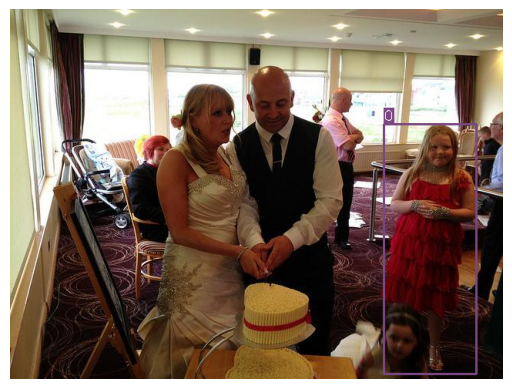

+--------+--------+-----+---------------------+-------------------------------------------------+
| Person | Gender | Age | Emotions categories | Continious emotions (Valence,Arousal,Dominance) |
+--------+--------+-----+---------------------+-------------------------------------------------+
|   0    |   M    |  A  |   ['Anticipation']  |                    [6, 4, 7]                    |
+--------+--------+-----+---------------------+-------------------------------------------------+


In [7]:
image_id = 1    # The id of the image to be displayed
row_example = annotations['train'].iloc[image_id]
display_img_annot(row_example)

In this initial sample, it can seen that not all the people are annotated and it does not relate to the closeness between the camera and the people. I will need to take this into account when I are training the model.

The path of the example image is: C:\Users\arman\Desktop\emotion_recognition\data\interim\images\mscoco\COCO_train2014_000000251754.jpg
The image orig DB is: mscoco
The image shape is: (457, 640, 3)
There is a total of 3 annotated people in the image
(391, 42) (153, 405)
(232, 49) (133, 366)
(85, 70) (108, 361)


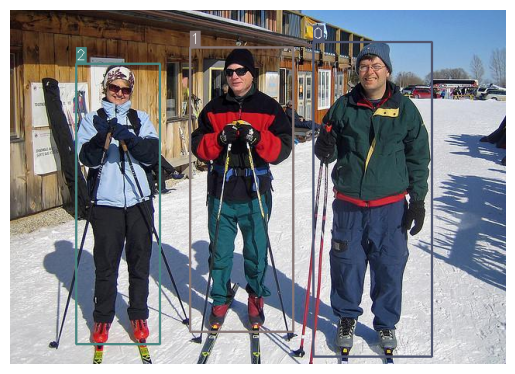

+--------+--------+-----+-----------------------------+-------------------------------------------------+
| Person | Gender | Age |     Emotions categories     | Continious emotions (Valence,Arousal,Dominance) |
+--------+--------+-----+-----------------------------+-------------------------------------------------+
|   0    |   M    |  A  | ['Engagement', 'Happiness'] |                    [4, 4, 4]                    |
|   1    |   M    |  A  |        ['Excitement']       |                    [6, 6, 6]                    |
|   2    |   F    |  A  |        ['Engagement']       |                    [7, 4, 7]                    |
+--------+--------+-----+-----------------------------+-------------------------------------------------+


In [8]:
image_id = 395    # The id of the image to be displayed
row_example = annotations['train'].iloc[image_id]
display_img_annot(row_example)

# 1.Data sanity check
Now I will check if the data is correctly loaded and if the annotations are correct. I will check the following:

* 1\.1\. Check NA values
* 1\.2\. Check img size and channels
* 1\.3\. Check bbox

## 1.1.Check NA values

I will check the NA values for continuous and categorical labels. First I will search for the nan values for all dataset.

In [9]:
# Dictionary to store the number of NA values for each database
na_values_cat = {db: 0 for db in databases}
na_values_cont = {db: 0 for db in databases}
# Compute the number of NA values for each database
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        for person in range(sample['people']):
            if sample ["label_cat"][person] == ['NA']:
                na_values_cat[original_db] += 1
            if math.isnan(sample ["label_cont"][person][0]) or math.isnan(sample ["label_cont"][person][1]) or math.isnan(sample ["label_cont"][person][2]):
                na_values_cont[original_db] += 1

Now, the results are shown in a table:

In [10]:
# Create the table
table_na_values = PrettyTable()
# Define column names
table_na_values.field_names = ["Original DB","NA on categorical label", "NA on continous label"]
# Add rows
for original_db in na_values_cat.keys():
    table_na_values.add_row([original_db, na_values_cat[original_db], na_values_cont[original_db]])
print(table_na_values)

+-------------+-------------------------+-----------------------+
| Original DB | NA on categorical label | NA on continous label |
+-------------+-------------------------+-----------------------+
|    ade20k   |            0            |           0           |
| emodb_small |            1            |           2           |
|   framesdb  |            0            |          357          |
|    mscoco   |            0            |           0           |
+-------------+-------------------------+-----------------------+


It can observed that there is only one NA value in the categorical labels. But there are a lot of NA values in the continuous labels. Now I will show which are the images with NA values in the continuous labels. Concretely the `show_NA_images` to avoid cluttering the notebook:

In [11]:
show_NA_images = 5
NA_identified = 0
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        for person in range(sample['people']):
            if math.isnan(sample ["label_cont"][person][0]) or math.isnan(sample ["label_cont"][person][1]) or math.isnan(sample ["label_cont"][person][2]):
                print("The image \'", data_split, photo_idx, "\' with the annotated people labels:", sample['label_cont'])
                NA_identified += 1
                break

        if NA_identified == show_NA_images:
            break

The image ' train 23 ' with the annotated people labels: [[7, 4, 7], [nan, nan, nan]]
The image ' train 106 ' with the annotated people labels: [[7, 7, 6], [nan, nan, nan], [7, 8, 4], [6, 5, 6], [nan, nan, nan], [5, 7, 5]]
The image ' train 212 ' with the annotated people labels: [[8, 6, 7], [8, 5, 7], [nan, nan, nan]]
The image ' train 250 ' with the annotated people labels: [[5, 2, 9], [nan, nan, nan]]
The image ' train 263 ' with the annotated people labels: [[nan, nan, nan]]


Here it can be observed one of these images:

The path of the example image is: C:\Users\arman\Desktop\emotion_recognition\data\interim\images\framesdb\frame_dy0xnq4fy1sn1ra8.jpg
The image orig DB is: framesdb
The image shape is: (2416, 4288, 3)
There is a total of 6 annotated people in the image
(217, 894) (931, 1439)
(3050, 735) (652, 1552)
(3389, 785) (868, 1630)
(1, 535) (534, 1327)
(1386, 864) (359, 512)
(3566, 611) (227, 371)


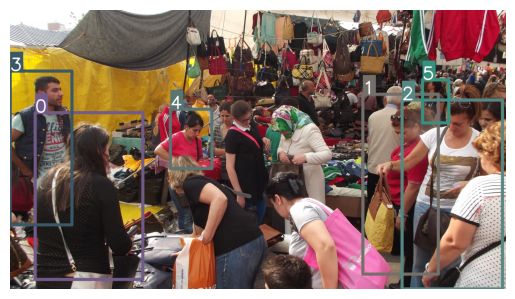

+--------+--------+-----+--------------------------------+-------------------------------------------------+
| Person | Gender | Age |      Emotions categories       | Continious emotions (Valence,Arousal,Dominance) |
+--------+--------+-----+--------------------------------+-------------------------------------------------+
|   0    |   F    |  A  | ['Anticipation', 'Engagement'] |                    [5, 2, 8]                    |
|   1    |   F    |  A  |       ['Disconnection']        |                 [nan, nan, nan]                 |
|   2    |   F    |  A  | ['Anticipation', 'Engagement'] |                    [5, 2, 9]                    |
|   3    |   M    |  A  |       ['Disconnection']        |                 [nan, nan, nan]                 |
|   4    |   F    |  A  |         ['Engagement']         |                 [nan, nan, nan]                 |
|   5    |   F    |  A  |       ['Disconnection']        |                    [5, 4, 5]                    |
+--------+--------+

In [12]:
image_id = 397    # The id of the image to be displayed
row_example = annotations['train'].iloc[image_id]
display_img_annot(row_example, bbox_thickness = 25, font_size = 5) 

Even though there are annotated people in the image, there are no continuous annotations for them. And most of the bbox annotations are poor and with no logical approach (as there are many people of similar size and locality that is not being annotated). I will need to take this into account when preprocessing the data. 

## 1.2.Check img size and channels
Now I will focus on image sizes and check if they are given in a correct format and size. From experimenting, I discovered that emodb_small has inverted the height and width of the images, instead of the standard width and height. I will keep in mind this in order to not have problems when making the checks.

In [13]:
# Define the directory where the images are located
photo_directory = os.path.join(INTERIM_DATA_DIR, "images")

# Define the dictionaries to store the results
different_img_sz_database = {db: 0 for db in databases}
bw_images_database = {db: 0 for db in databases}

# Search for the images with different size than the one stored in the annotations
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        photo_file = sample['path']
        original_db = sample['orig_db']

        if original_db == 'emodb_small':
            height, width  = sample['img_size']
        else:
            width, height = sample['img_size']
        
        # Read the image
        img_file = sample['path']
        img_path = os.path.join(photo_directory, img_file)
        img = cv2.imread(img_path)

        # Get the size of the image
        img_h, img_w, channels = img.shape

        # Compute the metrics
        if (width, height) != (img_w, img_h):
            print("The image ", photo_idx," in the data split \'", data_split, "\' has a different size than the one stored in the annotations.", sep = "")
            different_img_sz_database[original_db] += 1
        
        if channels != 3:
            bw_images_database[original_db] = 1

The image 398 in the data split 'train' has a different size than the one stored in the annotations.


KeyboardInterrupt: 

In [ ]:
# Create a table
table_img_sz_bw = PrettyTable()
# Define column names
table_img_sz_bw.field_names = ["Original DB","Number of different img_size", "Number of black and white images"]
# Add rows
for original_db in different_img_sz_database.keys():
    table_img_sz_bw.add_row([original_db, different_img_sz_database[original_db], bw_images_database[original_db]])
print(table_img_sz_bw)

+-------------+------------------------------+----------------------------------+
| Original DB | Number of different img_size | Number of black and white images |
+-------------+------------------------------+----------------------------------+
|    ade20k   |              0               |                0                 |
| emodb_small |              0               |                0                 |
|   framesdb  |              5               |                0                 |
|    mscoco   |              0               |                0                 |
+-------------+------------------------------+----------------------------------+


There are only 5 images that can be considered different as the given img size. I show two of these images and see how they are annotated:

The image size stored in the annotations is: 566 x 730
The path of the example image is: C:\Users\arman\Desktop\emotion_recognition\data\interim\images\framesdb\frame_0cs63q843g5bdvq5.jpg
The image orig DB is: framesdb
The image shape is: (724, 971, 3)
There is a total of 1 annotated people in the image


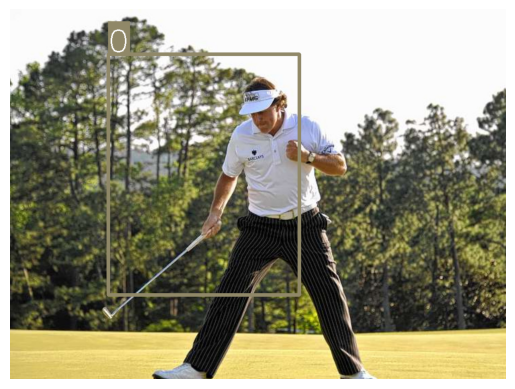

+--------+--------+-----+------------------------------------------------------+-------------------------------------------------+
| Person | Gender | Age |                 Emotions categories                  | Continious emotions (Valence,Arousal,Dominance) |
+--------+--------+-----+------------------------------------------------------+-------------------------------------------------+
|   0    |   M    |  A  | ['Engagement', 'Excitement', 'Pleasure', 'Yearning'] |                    [6, 9, 9]                    |
+--------+--------+-----+------------------------------------------------------+-------------------------------------------------+


In [ ]:
# Get sample from image_id
image_id = 398
sample = annotations['train'].iloc[image_id]

# Get the image size
img_sz = sample ['img_size']
if sample ['orig_db'] == 'emodb_small':
    print("The image size stored in the annotations is:", img_sz[0], "x", img_sz[1])
else:
    print("The image size stored in the annotations is:", img_sz[1], "x", img_sz[0])

# Display the image annotations
display_img_annot(sample, bbox_thickness = 5, font_size = 2)

The image size stored in the annotations is: 4928 x 3264
The path of the example image is: C:\Users\arman\Desktop\emotion_recognition\data\interim\images\framesdb\frame_apztd5rqirir5vuz.jpg
The image orig DB is: framesdb
The image shape is: (3264, 4928, 3)
There is a total of 2 annotated people in the image


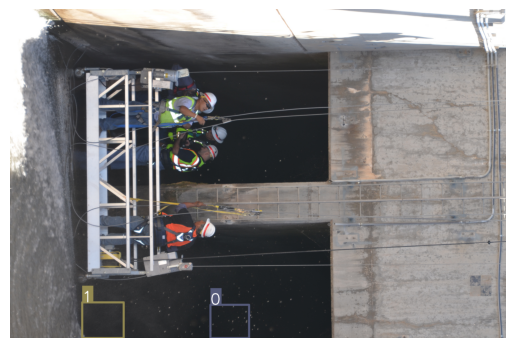

+--------+--------+-----+---------------------+-------------------------------------------------+
| Person | Gender | Age | Emotions categories | Continious emotions (Valence,Arousal,Dominance) |
+--------+--------+-----+---------------------+-------------------------------------------------+
|   0    |   M    |  A  |    ['Engagement']   |                    [6, 8, 7]                    |
|   1    |   M    |  A  |    ['Engagement']   |                    [5, 7, 8]                    |
+--------+--------+-----+---------------------+-------------------------------------------------+


In [ ]:
# Get sample from image_id
image_id = 8594
sample = annotations['train'].iloc[image_id]

# Get the image size
img_sz = sample ['img_size']
if sample ['orig_db'] == 'emodb_small':
    print("The image size stored in the annotations is:", img_sz[0], "x", img_sz[1])
else:
    print("The image size stored in the annotations is:", img_sz[1], "x", img_sz[0])

# Display the image annotations
display_img_annot(sample, bbox_thickness = 20, font_size = 5)

It can be seen that the images bbox make no sense at all, so maybe the given image is incorrect. I will need to take this into account when preprocessing the data.

## 1.3.Check bbox
Now I will check if the bbox are inside the image. 

In [ ]:
# Define the directory where the images are located
photo_directory = os.path.join(INTERIM_DATA_DIR, "images")

# Define the list to store not valid photo paths
not_valid_bbox = []
count_too_small = 0
sum_error_too_small = 0
count_too_big = 0
sum_error_too_big = 0
count_too_small_and_big = 0
count_incorrect_order = 0
original_db_count_of_errors = {}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        photo_file = sample['path']
        original_db = sample['orig_db']
        # Get the image size depending on the original database
        if original_db == 'emodb_small':
            height, width  = sample['img_size']
        else:
            width, height = sample['img_size']
        # Get bbox for each person in image
        for person in range (sample["people"]):
            x1 = sample["bbox"][person][0]; y1 = sample["bbox"][person][1]
            x2 = sample["bbox"][person][2]; y2 = sample["bbox"][person][3]

            if x1 < 0 or y1 < 0 or x2 > width or y2 > height or x1 > x2 or y1 > y2:
                not_valid_bbox.append(photo_file)
                if (x1 < 0 or y1 < 0) and (x2 > width or y2 > height):
                    count_too_small_and_big += 1
                    sum_error_too_small += max (0 - x1, 0) + max (0 - y1, 0)
                    sum_error_too_big += max (x2 - width, 0) + max (y2 - height, 0)
                elif x1 < 0 or y1 < 0:
                    count_too_small += 1
                    sum_error_too_small += max (0 - x1, 0) + max (0 - y1, 0)
                elif x2 > width or y2 > height:
                    count_too_big += 1
                    sum_error_too_big += max (x2 - width, 0) + max (y2 - height, 0)
                elif x1 > x2 or y1 > y2:
                    count_incorrect_order += 1

                if original_db not in original_db_count_of_errors.keys():
                    original_db_count_of_errors[original_db] = 1
                else:
                    original_db_count_of_errors[original_db] += 1

print("The number of not valid bounding boxes is:", count_too_small+count_too_big+count_incorrect_order+count_too_small_and_big)
print (count_too_small, "\tare too small to 0,0 origin")
print (count_too_big, "\tare too big with respect to the image size, with mean error of", sum_error_too_big/count_too_big)
print (count_too_small_and_big, "\tare too small and too big")
print (count_incorrect_order, "\tare in incorrect relation between x1, x2, y1, y2")

print("\nThe errors comes from the following original databases:")
for key in original_db_count_of_errors.keys():
    print(key, ":", original_db_count_of_errors[key])


print("\nThe mean error for x1 < 0 or y1 < 0: \t\t", sum_error_too_small/(count_too_small+count_too_small_and_big))
print("The mean error for x2 > width or y2 > height:\t", round(sum_error_too_big/(count_too_big+count_too_small_and_big), 3))


The number of not valid bounding boxes is: 400
22 	are too small to 0,0 origin
360 	are too big with respect to the image size, with mean error of 4.377777777777778
18 	are too small and too big
0 	are in incorrect relation between x1, x2, y1, y2

The errors comes from the following original databases:
emodb_small : 400

The mean error for x1 < 0 or y1 < 0: 		 2.025
The mean error for x2 > width or y2 > height:	 4.169


It can observed that many of these errors come from emodb that has bbox that are outside the image. But as the errors are small, I will not correct them now as they are not very important for the general distribution of bbox sizes.

# 2.Data exploration over all data
First I will analyze the distribution of the data over all the dataset. We will analyze the following:
* 2\.1\. Total people and images available
* 2\.2\. Gender and age distribution
* 2\.3\. Bbox distribution
* 2\.4\. Emotion distribution

## 2.1.Total people and images available
The total number of images and people is:

In [ ]:
total_images = 0
total_people = 0
for data_split in annotations.keys():
    total_images += len(annotations[data_split])
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        total_people += sample['people']

print ("Total number of images:", total_images)
print ("Total number of people:", total_people)

Total number of images: 23554
Total number of people: 34320


The number of images does not coincide with the paper, but the number of people does, so maybe the number of images is wrong in the paper or maybe there are some images that are not given.

## 2.2.Gender and age distribution
Now I will have a look on the age and gender distributions over all data. First I will compute the metrics and then visualize it:

In [ ]:
# Dictionary to store the number of people for each database
gender_dict = {}
age_dict = {}
# Compute the number of people
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        for person in range (sample['people']):
            # Get gender
            if sample['gender'][person] not in gender_dict.keys():
                gender_dict[sample['gender'][person]] = 1
            else:
                gender_dict[sample['gender'][person]] += 1
            # Get age
            if sample['age'][person] not in age_dict.keys():
                age_dict[sample['age'][person]] = 1
            else:
                age_dict[sample['age'][person]] += 1

# Convert dictionary to pandas DataFrame
df1 = pd.DataFrame(list(gender_dict.items()), columns=['Gender', 'Number of people'])
df2 = pd.DataFrame(list(age_dict.items()), columns=['Age', 'Number of people'])

The results are shown using a bar chart:

In [ ]:
bar_chart_gender = alt.Chart(df1).mark_bar(color='steelblue', size=15).encode(
    x=alt.X('Gender:O', title='Gender',axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Number of people:Q', title='Number of people')
).properties(
    title = alt.TitleParams(text = 'People`s gender distribution', fontSize=16),
    width = 200,
    height = 400
)

bar_chart_age = alt.Chart(df2).mark_bar(color='steelblue', size=15).encode(
    x=alt.X('Age:O', title='Age', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Number of people:Q', title='Number of people')
).properties(
    title = alt.TitleParams(text = 'People`s age distribution', fontSize=16),
    width = 200,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
age_gender_chart = (bar_chart_gender | bar_chart_age).resolve_scale(y='shared')

age_gender_chart

alt.HConcatChart(...)

It can be observed that the most common annotations is a male adult. For the people gender distribution it is more or less balanced, but for the age distribution it is not. There are much more adults than children and more children than elderly people. This is important to take into account when training the model, as it will be more biased to predict well  on adults than to children or elderly people.

## 2.3.Body bbox distribution:
Now I will check the bbox distribution over all data. First I will compute the metrics and then visualize it using a histogram:

In [ ]:
# Create a list to store all the labels
width = []
height = []
ratio = []

# Get image sizes using the annotations
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        for person in range(sample['people']):
            bbox = sample['bbox'][person]
            width.append(bbox[2]-bbox[0])
            height.append(bbox[3]-bbox[1])
            ratio.append((bbox[2]-bbox[0])/(bbox[3]-bbox[1])) # width/height

# Create a pandas dataframe 
df1 = pd.DataFrame(width, columns=['Width'])
df2 = pd.DataFrame(height, columns=['Height'])
# Count the number of occurrences
df1['Count'] = df1.groupby(['Width'])['Width'].transform('count')
df2['Count'] = df2.groupby(['Height'])['Height'].transform('count')
# Drop duplicates
df1 = df1.drop_duplicates()
df2 = df2.drop_duplicates()

In [ ]:
hist_width= alt.Chart(df1).mark_bar(color='steelblue').encode(
    x=alt.X('Width:Q', title='Width value (px)',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(0, max(df1['Width'])))),
    y=alt.Y('Count:Q', title='Count of people'),
).properties(
    title = alt.TitleParams(text = 'Photo width distribution', fontSize=20),
    width = 400,
    height = 400
)

hist_height = alt.Chart(df2).mark_bar(color='steelblue').encode(
    x=alt.X('Height:Q', title='Height value (px)',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(0, max(df2['Height'])))),
    y=alt.Y('Count:Q', title='Count of people'),
).properties(
    title = alt.TitleParams(text = 'Photo height distribution', fontSize=20, baseline='line-top'),
    width = 400,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
width_height_chart = alt.hconcat(hist_width, hist_height).resolve_scale(y='shared')

width_height_chart

alt.HConcatChart(...)

It can be seen that many of the probability mass is centered around 0 to 500 px. This is important to take into account when choosing the model input size and be able to fit most images without making any distortion over them. 

Now I will check the distribution of the aspect ratio using a histogram:

In [ ]:
# Create pandas dataframe
df1 = pd.DataFrame(ratio, columns=['Ratio'])
# Count the number of occurrences for each 'Ratio''
df1['Count'] = df1.groupby(['Ratio'])['Ratio'].transform('count')
# Drop duplicates
df1 = df1.drop_duplicates()

In [ ]:
hist_ratio= alt.Chart(df1).mark_bar(color='steelblue').encode(
    x=alt.X('Ratio:Q', title='Ratio (log-scale)',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(0, max(df1['Ratio'])))).scale(type="log"),
    y=alt.Y('Count:Q', title='Count of people'),
).properties(
    title = alt.TitleParams(text = 'Bbox ratio (width/heigth) distribution', fontSize=20),
    width = 400,
    height = 400
)

hist_ratio

alt.Chart(...)

The ratio is defined as the width divided by the height. I decided to use the log scale to see the distribution better. This way I can expand the values between [0,1] (the bbox with vertical rectangle), and see with equal relevance the values situated at the right of the plot (the bbox with horizontal rectangle). 

It can observed that the main kind of bbox is the vertical one, as the ratio is between 0 and 1. Also we observe the biggest bar is located at 1, so many values have a 1:1 ratio. Also we have a second spike around 1:2 so there are many bbox with a 1:2 ratio.  This is expected as many people are standing up and the bbox are vertical rectangles.

## 2.4.Emotion distribution
Now I will check the emotion distribution over all data. I will focus on analyzing first the categorical labels and then the continuous labels.

For the categorical labels I will analyze:
* 2\.4\.1\.1\. Number of emotions felt per each person
* 2\.4\.1\.2\. Categorical emotion distribution
* 2\.4\.1\.3\. Co-ocurrence matrix
* 2\.4\.1\.4\. Mean color for each categorical emotion

For the continuous labels I will analyze:
* 2\.4\.2\.1\. Continuous emotion distribution
* 2\.4\.2\.2\. Covariance matrix

### 2.4.1 Categorical annotations analysis and exploration

The main goal of this section is to understand the distribution of the categorical annotations in the dataset. I will check the distribution of the annotations in the whole dataset. The annotated categorical annotations are (I take train datasplit as example):

In [ ]:
annotated_emotions = []
for emotions_annotated in annotations['train']['label_cat']:
    for person in emotions_annotated:
        for emotion in person:
            if emotion not in annotated_emotions:
                annotated_emotions.append(emotion)


print("In total, there are", len(annotated_emotions), "emotions annotated.")
print("The emotions found are:", annotated_emotions)

In total, there are 26 emotions annotated.
The emotions found are: ['Disconnection', 'Doubt/Confusion', 'Anticipation', 'Engagement', 'Excitement', 'Happiness', 'Aversion', 'Pleasure', 'Confidence', 'Peace', 'Fatigue', 'Pain', 'Sadness', 'Sensitivity', 'Suffering', 'Sympathy', 'Fear', 'Yearning', 'Disquietment', 'Esteem', 'Annoyance', 'Affection', 'Anger', 'Disapproval', 'Embarrassment', 'Surprise']


Here we can observe the meaning of each emotion following the paper:


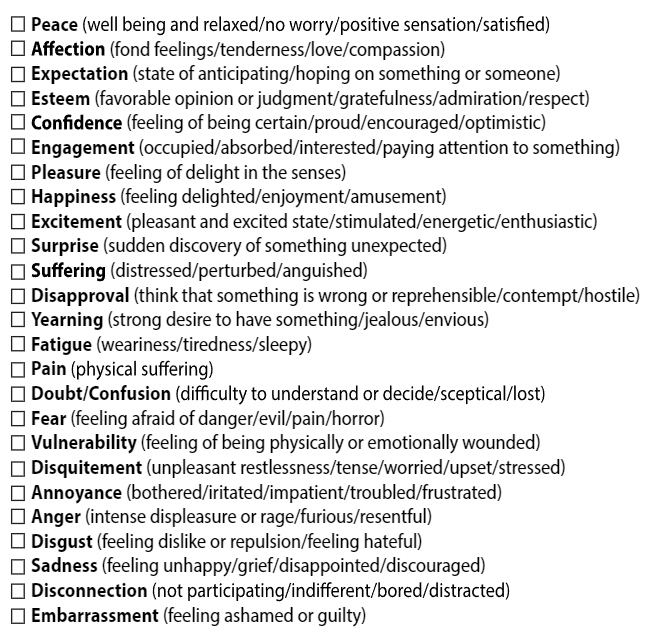

#### 2.4.1.1. Number of emotions felt per each person
First I will check the number of emotions felt per each person, this way we can know the expected number of predictions that will be done by the model when we train it. I will compute the metrics and then visualize it using a histogram:

In [ ]:
emotions_per_person = {}
emotion_count = {}
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        for person in range (sample['people']):
            emotions = sample["label_cat"][person]
            num_emotions = len(emotions)
            if num_emotions in emotions_per_person.keys():
                emotions_per_person[num_emotions] += 1
            else:
                emotions_per_person[num_emotions] = 1

            for emotion in emotions:
                if emotion in emotion_count.keys():
                    emotion_count[emotion] += 1
                else:
                    emotion_count[emotion] = 1

Now I analyze the number of emotions per photo:

In [ ]:
# Convert dictionary to pandas DataFrame
df = pd.DataFrame(list(emotions_per_person.items()), columns=['Number of emotions', 'Number of people'])

# Compute the average number of emotions per person
average_emotions = (df['Number of emotions'] * df['Number of people']).sum() / df['Number of people'].sum()



bar_chart = alt.Chart(df).mark_bar(color='steelblue', size=15).encode(
    x=alt.X('Number of emotions', title='Number of emotions'),
    y='Number of people'
).properties(
    title = alt.TitleParams(text = 'Number of emotions felt per each person', fontSize=20, dy = -20),
    width = 300,
    height = 400
)

# The expected value
average_line = alt.Chart(df).mark_rule(color='black').encode(
    x='average:Q',
    size=alt.value(2)
).transform_calculate(
    average=str(average_emotions)
)

# Text to show the value of the average
average_text = alt.Chart(df).mark_text(
    align='left',
    baseline='line-top',
    dx=7,  # Desplazar el texto a la derecha para que no se superponga con la línea
    dy=-100
).encode(
    x=alt.X('average:Q', title =''),
    text=alt.value('Average: ' + str(round(average_emotions, 2)))  # Redondear el valor promedio a 2 decimales
).transform_calculate(
    average=str(average_emotions)
)

# Superponer el gráfico de barras, la línea horizontal y la anotación de texto
chart = bar_chart + average_line + average_text

chart

alt.LayerChart(...)

It can be observed that many people has only one or two emotions per photo, but there are also people with more than 10 emotions per photo. This heavily weighted distribution towards the left will be important to take into account when training the model, as the model will try to predict around 2 or 3 emotions, and will have more difficulties with the less common ones above 8 as they are less frequent in the dataset.

In [ ]:
# Repeat the number of emotions for each person
emotions_repeated = np.repeat(df['Number of emotions'], df['Number of people'])

# Compute the quantiles of this new list
quantiles = np.quantile(emotions_repeated, [.25, .5, .75])

print("The Q1 quartile (25%) is located at:", quantiles[0])
print("The Q2 quartile (50%) or median is located at:", quantiles[1])
print("The Q3 quartile (75%) is located at:", quantiles[2])

The Q1 quartile (25%) is located at: 1.0
The Q2 quartile (50%) or median is located at: 2.0
The Q3 quartile (75%) is located at: 4.0


The distribution is heavily located in the left as it can be seen the quartiles. Around 75% of entries have less than 4.0 emotions per photo.

In [ ]:
number_of_emotions = 8
probability = len(emotions_repeated[emotions_repeated >= number_of_emotions]) / len(emotions_repeated) 
print("The probability to have", number_of_emotions, "or more emotions is:",probability*100, "%")

The probability to have 8 or more emotions is: 2.534965034965035 %


It can be seen in the distribution that less than 5% of the entries have 8 or more emotions per person. 

#### 2.4.1.2. Categorical emotion distribution

Now I analyze the occurrence of all the emotions in the dataset:

In [ ]:
# Convert dictionary to pandas DataFrame
# Ordenar las claves por valor en orden descendente
sorted_keys = sorted(emotion_count, key=emotion_count.get, reverse=True)
df = pd.DataFrame(list(emotion_count.items()), columns=['Categorical emotion', 'Number of people who felt it'])

bar_chart = alt.Chart(df).mark_bar(color='steelblue', size=15).encode(
    x=alt.X('Categorical emotion:O', sort = sorted_keys, axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('Number of people who felt it:Q')
).properties(
    title = alt.TitleParams(text = 'Emotions categories felt across all people', fontSize=20, dy = -20),
    width = 800,
    height = 400
)
bar_chart

alt.Chart(...)

It can be observed that the label distribution is not uniform. This is expected, as there are many emotions that has less occurrences than others. I will need to take care of this when training the model, as it could be biased towards the most common emotions.

I can also observe how the most usual emotion felt is engagement. I will take a closer look, to see the distribution of it to see if it's the only emotion felt or there are more:

In [ ]:
emotions_per_person = {} # Dictionary to store the number of emotions per person
selected_emotion = "Engagement" # I focus on the engagement emotion

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        for person in range (len(annotations[data_split].loc[photo_idx, "label_cat"])):
            emotions = annotations[data_split].loc[photo_idx, "label_cat"][person]
            num_emotions = len(emotions)
            if selected_emotion in emotions: # I filter by the selected emotion I are focusing
                if num_emotions in emotions_per_person.keys():
                    emotions_per_person[num_emotions] += 1
                else:
                    emotions_per_person[num_emotions] = 1

Now I will plot the results:

In [ ]:
# Convert dictionary to pandas DataFrame
df = pd.DataFrame(list(emotions_per_person.items()), columns=['Number of emotions', 'Number of people'])

bar_chart = alt.Chart(df).mark_bar(color='steelblue', size=15).encode(
    x='Number of emotions',
    y='Number of people'
).properties(
    title = alt.TitleParams(text = 'Number of emotions felt per each person that has \'Engagement\'', fontSize=20, dy=-20),
    width = 300,
    height = 400
)
bar_chart

alt.Chart(...)

It can observed that there are 5000 people that is labeled only as engagement. So I must take this into account when I are training the model and I must be careful with the results. Some data augmentation or label balance techniques could be useful to solve this problem.

#### 2.4.1.3. Co-occurrence matrix

I will now compute the co-occurrence matrix to see the distribution of the emotions felt together. This will be useful to see if there are emotions that are usually felt together or not and establish some relations between them.

Now I compute all the pairs, and add count them to add them to the co-occurrence matrix:

In [ ]:
list_pairs = []
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        for person in range (sample['people']):
            emotions = sample["label_cat"][person]
            pairs = list(itertools.product(emotions, repeat=2))
            list_pairs.extend(pairs)

# Count the occurrences of each pair
count = collections.Counter(list_pairs)
    
# Convert the count to a DataFrame
co_occurrence_df = pd.DataFrame.from_records(list(count.items()), columns=['pair', 'count'])
# Split the pair into two columns
co_occurrence_df[['EmotionA', 'EmotionB']] = pd.DataFrame(co_occurrence_df['pair'].tolist(), index=co_occurrence_df.index)
# Drop the 'pair' column
co_occurrence_df = co_occurrence_df.drop(columns='pair')
# Reorder the columns to move 'count' to the end
co_occurrence_df = co_occurrence_df[['EmotionA', 'EmotionB', 'count']]

co_occurrence_df = co_occurrence_df.loc[co_occurrence_df['EmotionA'] != 'NA'] # Remove the NA values

max_value_diff = co_occurrence_df.loc[co_occurrence_df['EmotionA'] != co_occurrence_df['EmotionB'], 'count'].max() # to set color range

Now I will plot the result. I will use a heatmap to see the distribution of the emotions felt together. I set the max value to the maximum number of co-occurrences between different emotions, this way I can focus on the information of different co-occurrences (as the emotion ocurrences are detailed in the previous sections and make this information harder to see):

In [ ]:
# Crear una selección interactiva
selection = alt.selection_single()
selection2 = alt.selection_multi(
    fields = ['EmotionA','EmotionB'],
    empty = 'none' # empty selection matches no points
)
# Crear un gráfico de calor
heatmap = alt.Chart(co_occurrence_df).mark_rect(stroke='black').encode(
    x=alt.X('EmotionA:O', sort='ascending', title = 'Emotion A category'),
    y=alt.Y('EmotionB:O', sort='ascending', title = 'Emotion B category'),
    color = alt.condition(
        alt.datum.EmotionA != alt.datum.EmotionB,  # Condición para las celdas de la diagonal
        alt.Color('count:Q', scale=alt.Scale(scheme='blues', domainMax = max_value_diff)),  # Paleta de colores 'viridis'
        alt.value('black')  # Color si la condición es falsa
    ),
    tooltip=['EmotionA', 'EmotionB', 'count']
)

# Configure text
text = alt.Chart(co_occurrence_df).mark_text(baseline='middle').encode(
    x= alt.X('EmotionA:O', sort='ascending'),
    y=alt.Y('EmotionB:O', sort='ascending'),
    text = 'count:Q',
    color = alt.value ("black"),
    opacity = alt.condition(selection2, alt.value(1),alt.value(0))
)


coocurrence_plot = heatmap + text
coocurrence_plot.properties(
    title = alt.TitleParams(text = 'Co-occurrence of emotions', fontSize=20, dy=-20),
    width = 800,
    height = 800
).add_selection(
    selection,
    selection2
)

alt.LayerChart(...)

It can be seen that there are some emotions that are heavily related, as they have a great value on the co-occurrence matrix. For example, engagement and excitement are usually felt together. Also, there are some emotions that are not usually felt together, like sadness and excitement. This is expected, as they are opposite emotions. I will need to keep this in mind as the model will try to predict the emotions felt together, and it will be easier to predict the emotions that are usually felt together. 

Now I will normalize each row of the co-occurrence matrix to see the the conditioned probability. This will help to see the probability of each emotion given another emotion. This way I can focus on the emotions that does not have as much entries and see how given a emotion (y axis), the probability of another emotion is affected (x axis).

In [ ]:
total_counts = co_occurrence_df.loc[co_occurrence_df['EmotionA'] == co_occurrence_df['EmotionB'], ['EmotionA', 'count']]
total_counts['count_total'] = total_counts['count'].astype(int)  # Convert 'count' column to integers
total_counts = total_counts.drop(columns='count')  # Drop the 'count' column

# Merge co_occurrence_df with total_counts
co_occurrence_conditioned_df = pd.merge(co_occurrence_df, total_counts, on='EmotionA', how='left')
co_occurrence_conditioned_df['conditioned_prob'] = co_occurrence_conditioned_df['count'] / co_occurrence_conditioned_df['count_total']
co_occurrence_conditioned_df = co_occurrence_conditioned_df.drop(columns=['count', 'count_total'])

Now I plot the result.

In [ ]:
# Crear una selección interactiva
selection = alt.selection_multi(
    fields = ['EmotionA'],
)
selection2 = alt.selection_multi(
    fields = ['EmotionA'],
    empty = 'none' # empty selection matches no points
)

tooltip=[
    {'field': 'EmotionA', 'title': 'Emotion A'},
    {'field': 'EmotionB', 'title': 'Emotion B'},
    {'field': 'conditioned_prob', 'title': 'Conditioned probability B|A'}
]
# Crear un gráfico de calor
heatmap = alt.Chart(co_occurrence_conditioned_df).mark_rect(stroke='black').encode(
    x=alt.X('EmotionB:O', sort='ascending', title = 'Emotion B'),
    y=alt.Y('EmotionA:O', sort='ascending', title = 'Emotion A'),
    color = alt.condition(selection, alt.Color('conditioned_prob:Q',
              title = 'Emotion A conditioned to B probability',
              scale = alt.Scale(scheme='oranges'), legend = alt.Legend(titleFontSize = 14, labelFontSize=12)), alt.value('grey')),
    opacity = alt.condition(selection, alt.value(1), alt.Opacity('conditioned_prob:Q')),
    tooltip=tooltip
)

# Crear el segundo gráfico de calor
heatmap2 = alt.Chart(co_occurrence_conditioned_df).mark_rect().encode(
    x= alt.X('EmotionB:O', sort='ascending'),
    y=alt.Y('EmotionA:O', sort='ascending'),
    color=alt.condition(
        alt.datum.EmotionB == alt.datum.EmotionA,  # Condición para las celdas de la diagonal
        alt.value('black'),  # Color si la condición es verdadera
        alt.value('transparent')  # Color si la condición es falsa
    )
)

# Crear el segundo gráfico de calor
heatmap3 = alt.Chart(co_occurrence_conditioned_df).mark_rect().encode(
    x= alt.X('EmotionB:O', sort='ascending'),
    y=alt.Y('EmotionA:O', sort='ascending'),
    color=alt.condition(
        alt.datum.EmotionB == alt.datum.EmotionA,  # Condición para las celdas de la diagonal
        alt.value('black'),  # Color si la condición es verdadera
        alt.value('transparent')  # Color si la condición es falsa
    )
)

# Configure text
text = alt.Chart(co_occurrence_conditioned_df).mark_text(baseline='middle').encode(
    x= alt.X('EmotionB:O', sort='ascending'),
    y=alt.Y('EmotionA:O', sort='ascending'),
    text = alt.Text('conditioned_prob:Q', format='.2f'),
    color = alt.value ("black"),
    opacity = alt.condition(selection2, alt.value(1),alt.value(0))
)


coocurrence_plot = heatmap + heatmap2 + heatmap3 + text
coocurrence_plot.properties(
    title = alt.TitleParams(text = 'Probability of appearing the Emotion B conditioned to Emotion A', fontSize=20, dy=-20),
    width = 800,
    height = 800
).add_selection(
    selection,
    selection2
)

alt.LayerChart(...)

It can be observed that the most probable variable is engagement, this is expected as it is the most common entry in the dataset. Also we can see that the probabilites does not sum up to 1. This is expected as the emotions are usually felt together. For example, if a person is feeling yearning is usually feeling anticipation and engament with a probability of around 0.5. 

#### 2.4.1.4. Mean color for each categorical emotion
Now I will study if there is any relation between the mean color of the image and the emotion felt. I will compute the mean color for each photo to which is annotated the emotion and plot the results.

First I will compute the mean color for each photo:

In [ ]:
# Define the directory where the images are located
photo_directory = os.path.join(INTERIM_DATA_DIR, "images")

# Initialize dictionaries to store the sum and count of colors for each emotion
sum_colors = defaultdict(lambda: np.array([0, 0, 0]))
count_colors = defaultdict(int)

for data_split in annotations.keys():
    if show_execution_iterations:
        print("Processing '", data_split, "' data split:", sep = "")
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        photo_file = sample['path']
        
        photo_path = os.path.join(photo_directory, photo_file)
        photo = cv2.imread(photo_path)
        #Convert the image to RGB format
        photo = cv2.cvtColor(photo, cv2.COLOR_BGR2RGB)
        # Compute the mean color of the photo
        mean_color = np.mean(photo, axis=(0, 1)).astype(int)
        for person in range (sample['people']):
            emotions = sample["label_cat"][person]
            for emotion in emotions:
                # Acumulate the sum and count of colors for each emotion
                sum_colors[emotion] += mean_color
                count_colors[emotion] += 1
                


        if show_execution_iterations and photo_idx % 2000 == 0:
            print("\tProcessed", photo_idx, "images")

In [ ]:
mean_colors = {}
total_sum = np.array([0, 0, 0], dtype=np.int64)
total_count = 0
for emotion in sum_colors.keys():
    mean_colors[emotion] = sum_colors[emotion] / count_colors[emotion]
    total_sum += sum_colors[emotion]
    total_count += count_colors[emotion]
mean_color_images = total_sum / total_count

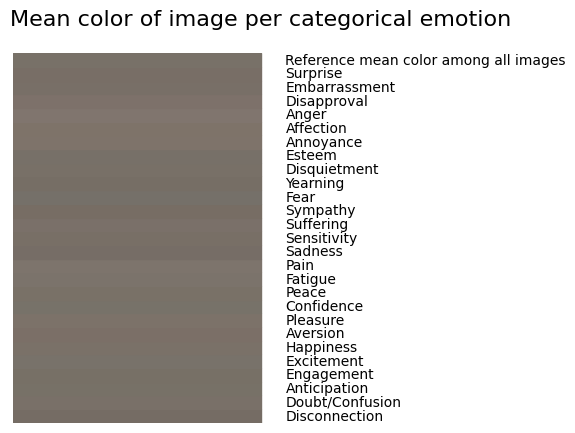

In [ ]:
# Create a figure and a subplot
fig, ax = plt.subplots()

# For each emotion, create a patch with the mean color and add it to the plot
for i, emotion in enumerate(mean_colors.keys()):
    if emotion != 'NA':
        ax.add_patch(plt.Rectangle((0, i), 1, 1, color=np.array(mean_colors[emotion])/255))
        ax.text(1.1, i+0.5, emotion, va='center')
    else:
        ax.add_patch(plt.Rectangle((0, i), 1, 1, color=mean_color_images/255))
        ax.text(1.1, i+0.5, "Reference mean color among all images", va='center')

# Set the limits and hide the axes
ax.set_xlim(0, 2)
ax.set_ylim(0, len(mean_colors)) # The number of emotions without NA
ax.axis('off')

# Add a title
ax.set_title('Mean color of image per categorical emotion', fontsize=16, pad = 20)

plt.show()

We can observe that there is some slight variation between the mean colors of each emotion. For example, the mean color of the photos with the emotion fear is a bit blueish than the mean color of the photos with the emotion anger. But as the the variation is not very big, I will not take this into account when training the model (if the training give me the expected results), I will only perform a normalization along all the images. 

Now I repeat for each person (not for whole image), if this effect is more noticeable:

In [ ]:
# Define the directory where the images are located
photo_directory = os.path.join(INTERIM_DATA_DIR, "images")

# Initialize dictionaries to store the sum and count of colors for each emotion
sum_colors = defaultdict(lambda: np.array([0, 0, 0], dtype=np.int64))
count_colors = defaultdict(int)

for data_split in annotations.keys():
    if show_execution_iterations:
        print("Processing '", data_split, "' data split:", sep = "")
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        photo_file = sample['path']
        
        photo_path = os.path.join(photo_directory, photo_file)
        photo = cv2.imread(photo_path)
        #Convert the image to RGB format
        photo = cv2.cvtColor(photo, cv2.COLOR_BGR2RGB)
        for person in range (sample['people']):
            x1 = sample["bbox"][person][0]; y1 = sample["bbox"][person][1]
            x2 = sample["bbox"][person][2]; y2 = sample["bbox"][person][3]

            # Correct the bounding box if outside the image limits
            if x1 < 0: x1 = 0
            if y1 < 0: y1 = 0
            if x2 > photo.shape[1]: x2 = photo.shape[1]
            if y2 > photo.shape[0]: y2 = photo.shape[0]

            mean_color = np.mean(photo[y1:y2,x1:x2], axis=(0, 1)).astype(int)
            emotions = sample["label_cat"][person]
            for emotion in emotions:
                # Acumulate the sum and count of colors for each emotion
                sum_colors[emotion] += mean_color
                count_colors[emotion] += 1
                
        if show_execution_iterations and photo_idx % 2000 == 0:
            print("\tProcessed", photo_idx, "images")

In [ ]:
mean_colors = {}
total_sum = np.array([0, 0, 0], dtype=np.int64)
total_count = 0
for emotion in sum_colors.keys():
    mean_colors[emotion] = sum_colors[emotion] / count_colors[emotion]
    total_sum += sum_colors[emotion]
    total_count += count_colors[emotion]
mean_color_people = total_sum / total_count

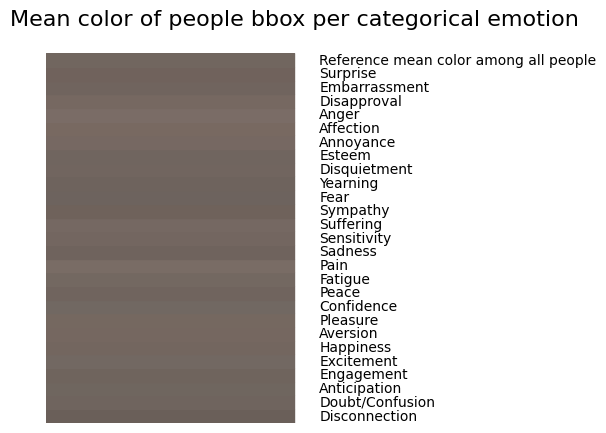

In [ ]:
# Create a figure and a subplot
fig, ax = plt.subplots()

# For each emotion, create a patch with the mean color and add it to the plot
for i, emotion in enumerate(mean_colors.keys()):
    if emotion != 'NA':
        ax.add_patch(plt.Rectangle((0, i), 1, 1, color=np.array(mean_colors[emotion])/255))
        ax.text(1.1, i+0.5, emotion, va='center')
    else:
        ax.add_patch(plt.Rectangle((0, i), 1, 1, color=mean_color_people/255))
        ax.text(1.1, i+0.5, "Reference mean color among all people", va='center')

# Set the limits and hide the axes
ax.set_xlim(0, 2)
ax.set_ylim(0, len(mean_colors))
ax.axis('off')

# Add a title
ax.set_title('Mean color of people bbox per categorical emotion', fontsize=16, pad = 20)

plt.show()

Now it can be observed that in general the mean colors are different from we have seen. For example, Surprise now is a bit reddish than the other emotions, and fear now more standard. But as the the variation is not very big, I have the same conclusion as the past section.

### 2.4.2. Continuous annotations analysis and exploration

To do that, first I will analize the general distribution continuous annotations. The continuous annotations are:
1. Valence: The valence of the emotion felt. It is a value between 1 and 10, where 0 is the most negative valence and 10 is the most positive valence.
2. Arousal: The arousal of the emotion felt. It is a value between 1 and 10, where 0 is the most calm arousal and 10 is the most excited arousal.
3. Dominance: The dominance of the emotion felt. It is a value between 1 and 10, where 0 is the most submissive dominance and 10 is the most dominant dominance.

Here we can observe the meaning of each continuous annotation following the paper:

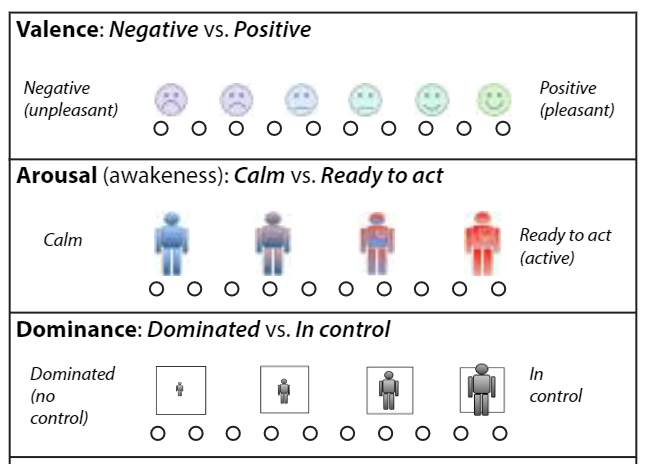

#### 2.4.2.1. Continious label distribution:
Now I will compute the necessary metrics to see the distribution of the continuous annotations in the dataset.

In [ ]:
continious_annotations = []
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        for person in range (sample['people']):
            labels = {'valence': sample["label_cont"][person][0],
             'arousal': sample["label_cont"][person][1],
             'dominance': sample["label_cont"][person][2]}
            continious_annotations.append(labels)

# Create a dataframe with sample data
continious_annotations = pd.DataFrame(continious_annotations).dropna()

In [ ]:
# Transform the data for ridge plot
continious_annotations_rowed = pd.melt(continious_annotations, var_name='Variable', value_name='Value')

In [ ]:
# Define the range
value_range = [continious_annotations_rowed['Value'].min(), continious_annotations_rowed['Value'].max()]

# Calculate the maximum count across all variables
max_count = max(
    continious_annotations_rowed[continious_annotations_rowed['Variable'] == 'valence']['Value'].value_counts().max(),
    continious_annotations_rowed[continious_annotations_rowed['Variable'] == 'arousal']['Value'].value_counts().max(),
    continious_annotations_rowed[continious_annotations_rowed['Variable'] == 'dominance']['Value'].value_counts().max()
)

# Create a histogram
valence_hist = alt.Chart(continious_annotations_rowed).mark_bar(color = "steelblue", width= 20).encode(
    alt.X("Value", scale=alt.Scale(domain=value_range)),
    alt.Y('count()', scale=alt.Scale(domain=[0, max_count])),
).transform_filter(
    alt.datum.Variable == 'valence'
).properties(
    title = alt.TitleParams(text = 'Valence Distribution', fontSize=16),
    width = 300,
    height = 400
)

# Create a histogram
arousal_hist = alt.Chart(continious_annotations_rowed).mark_bar(color = "steelblue", width= 20).encode(
    alt.X("Value", scale=alt.Scale(domain=value_range)),
    alt.Y('count()', scale=alt.Scale(domain=[0, max_count])),
).transform_filter(
    alt.datum.Variable == 'arousal'
).properties(
    title = alt.TitleParams(text = 'Arousal Distribution', fontSize=16),
    width = 300,
    height = 400
)

# Create a histogram
dominance_hist = alt.Chart(continious_annotations_rowed).mark_bar(color = "steelblue", width= 20).encode(
    alt.X("Value", scale=alt.Scale(domain=value_range)),
    alt.Y('count()', scale=alt.Scale(domain=[0, max_count])),
).transform_filter(
    alt.datum.Variable == 'dominance'
).properties(
    title = alt.TitleParams(text = 'Dominance Distribution', fontSize=16),
    width = 300,
    height = 400
)
# Concatenate the lollipop chart and bar chart horizontally
combined_chart = alt.hconcat(valence_hist, arousal_hist, dominance_hist).resolve_scale(y='shared').properties(
    title=alt.TitleParams(text = "Continuous annotations distributions", anchor='middle', fontSize=20, dy=-20),
)
combined_chart

alt.HConcatChart(...)

It can be seen that the distributions are far from the uniform distribution that we would like to see. The humans tend to annotate more towards tge middle of the range, and less to the extremes. This is important to take into account when training the model, as it will be more biased to predict well the annotations in the middle of the range than the annotations in the extremes. The distribution that shows a more spread weight is the arousal distribution, as it has more weight in 4-7 and not a huge spike in the middle of the range as valence and dominance.

Now I will show the mean and standard deviation of each continuous annotation:

In [ ]:
# Compute the mean for each column
mean = continious_annotations.mean()
mean = mean.to_dict()

# Compute the standard deviation for each column
std_dev = continious_annotations.std()
std_dev = std_dev.to_dict()

# Create the table
table_mean_std = PrettyTable()
# Define column names
table_mean_std.field_names = ["Continious annotation","Mean", "Std. Dev."]
# Add rows
for continious_annot in mean.keys():
    table_mean_std.add_row([continious_annot, round(mean[continious_annot], 3), round(std_dev[continious_annot],3)])
print(table_mean_std)

+-----------------------+-------+-----------+
| Continious annotation |  Mean | Std. Dev. |
+-----------------------+-------+-----------+
|        valence        | 5.984 |   1.316   |
|        arousal        | 5.613 |   1.917   |
|       dominance       | 6.483 |   1.675   |
+-----------------------+-------+-----------+


The results are the expected ones from the seen distributions. The distribution that shows a bigger standard deviation is the arousal one. We can observe also that dominance is centered around 6.5 and valence around 5.9. This is important to take into account when training the model, as it will be more biased to predict the annotations in the middle of the range than the annotations in the extremes.

#### 2.4.2.2. Covariance matrix:


Now I will check the covariance matrix between the continuous annotations. This will help us to see if there are some annotations that are related between them. This will be useful to see if the variables are independent.

In [ ]:
cov_matrix = continious_annotations.cov()

# Reshape the covariance matrix into a long format and keep all elements
cov_matrix_long = cov_matrix.stack().reset_index()

# Rename the columns
cov_matrix_long.columns = ['Variable_1', 'Variable_2', 'Covariance']

In [ ]:
tooltip=[
    {'field': 'Variable_1', 'title': 'Variable 1'},
    {'field': 'Variable_2', 'title': 'Variable 2'},
    {'field': 'Covariance', 'title': 'Covariance between variables'}
]

# Create a heatmap
heatmap = alt.Chart(cov_matrix_long).mark_rect(stroke='black').encode(
    x=alt.X('Variable_2:O', sort='ascending', title = 'Variable 2', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Variable_1:O', sort='ascending', title = 'Variable 1'),
    color = alt.Color('Covariance:Q', title = 'Covariance',
              scale = alt.Scale(scheme='oranges'), legend = alt.Legend(titleFontSize = 14, labelFontSize=12)),
    tooltip=tooltip
)

# Configure text
text = alt.Chart(cov_matrix_long).mark_text(baseline='middle').encode(
    x= alt.X('Variable_2:O', sort='ascending', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Variable_1:O', sort='ascending'),
    text = alt.Text('Covariance:Q', format='.2f'),
    color = alt.value ("black"),
)


covariance_plot = heatmap + text
covariance_plot.properties(
    title = alt.TitleParams(text = 'Covariance between emotion continious variables', fontSize=20, dy = -20),
    width = 400,
    height = 400
)

alt.LayerChart(...)

It can be observed that the variables are not strictly independent, as the covariance matrix is not diagonal. This is expected, as the annotations are a bit related between them. Now we will check the correlation matrix to see better the relation between the variables. This will help us to see if there are some annotations that are related between them. This will be useful to see if the variables are independent.

In [ ]:
# Calculate the correlation matrix
corr_matrix = continious_annotations.corr()

# Reshape the correlation matrix into a long format and keep all elements
corr_matrix_long = corr_matrix.stack().reset_index()

# Rename the columns
corr_matrix_long.columns = ['Variable_1', 'Variable_2', 'Correlation']

In [ ]:
tooltip=[
    {'field': 'Variable_1', 'title': 'Variable 1'},
    {'field': 'Variable_2', 'title': 'Variable 2'},
    {'field': 'Correlation', 'title': 'Correlation between variables'}
]

# Create a heatmap
heatmap = alt.Chart(corr_matrix_long).mark_rect(stroke='black').encode(
    x=alt.X('Variable_2:O', sort='ascending', title = 'Variable 2', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Variable_1:O', sort='ascending', title = 'Variable 1'),
    color = alt.Color('Correlation:Q', title = 'Correlation',
              scale = alt.Scale(scheme='oranges'), legend = alt.Legend(titleFontSize = 14, labelFontSize=12)),
    tooltip=tooltip
)

# Configure text
text = alt.Chart(corr_matrix_long).mark_text(baseline='middle').encode(
    x= alt.X('Variable_2:O', sort='ascending', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Variable_1:O', sort='ascending'),
    text = alt.Text('Correlation:Q', format='.2f'),
    color = alt.value ("black"),
)


covariance_plot = heatmap + text
covariance_plot.properties(
    title = alt.TitleParams(text = 'Correlation between emotion continious variables', fontSize=20, dy = -20),
    width = 400,
    height = 400
)

alt.LayerChart(...)

 We can observe that the correlation in general is very low. On the one hand, valence and arousal have a value of 0.16 showing a very weak relation. On the other hand, arousal and dominance and valence and dominance have a value of 0.27 and 0.29 respectively, showing a weak relation. This is expected, as the annotations are a bit related between them. For example, if the arousal is high (high stimulation) is expected that the dominance is usually high too (control of emotion). This is maybe caused by the fact that the higher the stimulus the higher control over the emotion I have (example of skater). 

# 3.Data exploration over each split
Here I will check the main features of each data split, such as the number of rows and columns, the data types of the columns and the number of null values. I will also store the insights to then create visualizations to ease the comparison between the splits.

I will check the following:
* 3\.1\. Data splits main features
* 3\.2\. Gender and age distribution for each data split
* 3\.3\. Categorical annotations distributions on data splits for each data split
* 3\.4\. Continuous annotations distributions on data splits for each data split

## 3.1.Data splits main features
Now I show the main features of each split and the ratio of each split with respect to the whole dataset:

In [ ]:
# Dataframe to store the insights
insights_dataframe = []

# Create a table
insight_splits_table = PrettyTable()
# Define column names
insight_splits_table.field_names = ["Data Split","Number of Columns", "Equal to standard columns", "Number of images", "Number of People"]


for data_split in annotations.keys():
    # Generate insights
    columns = len(list(annotations[data_split].columns))
    equal_to_standard = list(annotations[data_split].columns) == INTERIM_COLUMNS    
    num_images = annotations[data_split].shape[0]
    people = sum(annotations[data_split]['people'])
    people_per_photo = round(people/num_images, 2)

    # Add insights to the table or dataframe
    insight_splits_table.add_row([data_split, columns, equal_to_standard, num_images, people])
    insights_dataframe.append({'data_split': data_split, 'people_per_photo': people_per_photo, 'num_images': num_images})

    
print(insight_splits_table)
total_images = insights_dataframe[0]['num_images'] + insights_dataframe[1]['num_images'] + insights_dataframe[2]['num_images']

print("The ratio of images per each datasplits is: train", round(insights_dataframe[0]['num_images']/total_images, 2), 
      "/ val", round(insights_dataframe[1]['num_images']/total_images, 2), 
      "/ test", round(insights_dataframe[2]['num_images']/total_images, 2))


+------------+-------------------+---------------------------+------------------+------------------+
| Data Split | Number of Columns | Equal to standard columns | Number of images | Number of People |
+------------+-------------------+---------------------------+------------------+------------------+
|   train    |         9         |            True           |      17077       |      23706       |
|    val     |         9         |            True           |       2088       |       3334       |
|    test    |         9         |            True           |       4389       |       7280       |
+------------+-------------------+---------------------------+------------------+------------------+
The ratio of images per each datasplits is: train 0.73 / val 0.09 / test 0.19


All data splits have the same number of columns and are equal to the standard columns. The number of images are different one to another as it can be seen in the table. Also the ratio of train, validation and test is unusual. When training the model and doing the hyperparameter optimization this is needed to keep in mind if we follow this structure. 

Now I will observe the images in each data split and the ratio of people appearing on it:

In [ ]:
data = pd.DataFrame(insights_dataframe)

# Ratio people per photo ----------------------------
# Create dot plot
dot_chart = alt.Chart(data).mark_circle(size=100, color='#FF3333', opacity = 1.0).encode(
    x=alt.X('people_per_photo:Q',  scale=alt.Scale(reverse=True), axis = alt.Axis(title = 'People per photo', titleFontSize = 14,)),
    y=alt.Y('data_split:O', sort = desired_datasplit_order).title('')
).properties(
    title = alt.TitleParams(text = 'Ratio of people apearing in each photo', anchor='middle', fontSize=16, dy=-10),
    width = 600,
    height = 150
)
# Add connecting lines (lollipop stems)
stem_chart = alt.Chart(data).mark_rule(color='#FF9999').encode(
    x=alt.X('people_per_photo:Q',  scale=alt.Scale(reverse = True)),
    y=alt.Y('data_split:O', sort = desired_datasplit_order, axis = None)
)
# Combine the two charts
lollipop_people_per_photo = (stem_chart + dot_chart)

# Number of images ----------------------------
# Create dot plot
dot_chart2 = alt.Chart(data).mark_circle(size=100, color='steelblue', opacity = 1.0).encode(
    x=alt.X('num_images:Q', axis = alt.Axis(title = 'Total images', titleFontSize = 14,)),
    y=alt.Y('data_split:O', sort = desired_datasplit_order, 
            axis = alt.Axis(labelPadding = 35, labelAlign = alt.Align('center'), labelFontSize=12, 
                            title ='Data split',  titleBaseline="line-top", titleY = -3, titleX=-70, 
                            titleAngle = 0,  titleFontSize = 14, titleAlign= alt.Align('left')))
).properties(
    title = alt.TitleParams(text = 'Number of images in data splits', anchor='middle', fontSize=16, dy=-10),
    width = 600,
    height = 150
)
# Add connecting lines (lollipop stems)
stem_chart2 = alt.Chart(data).mark_rule(color='#87CEEB', opacity = 1.0).encode(
    x=alt.X('num_images:Q'),
    y=alt.Y('data_split:O', sort = desired_datasplit_order)
)
# Combine the two charts
lollipop_number_images = stem_chart2 + dot_chart2

# Concatenate the lollipop chart and bar chart horizontally
combined_chart = alt.hconcat(lollipop_people_per_photo, lollipop_number_images).configure_concat(
    spacing=5
).properties(
    title=alt.TitleParams(text = "Data photo and people insights per each data split", anchor='middle', fontSize=20, dy=-20),
)
combined_chart

alt.HConcatChart(...)

It can be observed that the ratio of people is very similar, having most in the test set, followed by the validation and train sets. This is expected as the test set is the hardest one. But when talking about sized we can see that the train validation is the one that has the biggest size. This is expected as the train set is the one that has the most images. Also it can be observed the strange proportion size of test and validation sets I talked about earlier.

## 3.2.Gender and age distribution for each data split
Now I will check the gender and age distribution across the data splits to see if they are similar or not.

In [ ]:
# Create a dictionary for each data split
data_split_dicts_gender = {split: {} for split in desired_datasplit_order}
data_split_dicts_age = {split: {} for split in desired_datasplit_order}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        for person in range(sample['people']):
            if sample['gender'][person] not in data_split_dicts_gender[data_split].keys():
                data_split_dicts_gender[data_split][sample['gender'][person]] = 1
            else:
                data_split_dicts_gender[data_split][sample['gender'][person]] += 1
            if sample['age'][person] not in data_split_dicts_age[data_split].keys():
                data_split_dicts_age[data_split][sample['age'][person]] = 1
            else:
                data_split_dicts_age[data_split][sample['age'][person]] += 1

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(data_split, gender, count) for data_split, gender_dict in data_split_dicts_gender.items() for gender, count in gender_dict.items()], columns=['Data_split', 'Gender', 'Number of people'])
df2 = pd.DataFrame([(data_split, age, count) for data_split, age_dict in data_split_dicts_age.items() for age, count in age_dict.items()], columns=['Data_split', 'Age', 'Number of people'])
# Divide by the total sum of values for each data split
df1['Number of people'] = df1.groupby('Data_split')['Number of people'].transform(lambda x: x / x.sum())
df2['Number of people'] = df2.groupby('Data_split')['Number of people'].transform(lambda x: x / x.sum())

Now I will plot the results:

In [ ]:
bar_chart_gender = alt.Chart(df1).mark_bar(color='orange', size=15).encode(
    x=alt.X('Gender:O', title='Gender',axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Number of people:Q', title='Proportion of people'),
    column=alt.Column('Data_split:N', title='Data split',  header=alt.Header(titleFontSize=14, labelFontSize=12), sort = desired_datasplit_order)
).properties(
    title = alt.TitleParams(text = 'People`s gender distribution normalized by size of datasplit', fontSize=20),
    width = 100,
    height = 400
)

bar_chart_age = alt.Chart(df2).mark_bar(color='orange', size=15).encode(
    x=alt.X('Age:O', title='Age', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Number of people:Q', title='Proportion of people'),
    column=alt.Column('Data_split:N', title='Data split',  header=alt.Header(titleFontSize=14, labelFontSize=12), sort = desired_datasplit_order)
).properties(
    title = alt.TitleParams(text = 'People`s age distribution normalized by size of datasplit', fontSize=20, anchor='middle'),
    width = 100,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
age_gender_chart = (bar_chart_gender | bar_chart_age).resolve_scale(y='shared')

age_gender_chart

alt.HConcatChart(...)

We can observe that across splits the results are very similar regarding gender. This is expected as the data splits are made to be similar one to another. Only there is a slight difference between age distributions. 

## 3.3. Categorical annotations distribution for each data split
Now I will check the categorical annotations distribution across the data splits to see if they are similar or not.

In [ ]:
datasplit_dicts_cat_annot = {datasplit: {} for datasplit in desired_datasplit_order}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        for person in range(sample['people']):
            emotions = sample["label_cat"][person]
            for emotion in emotions:
                if emotion != 'NA':
                    if emotion not in datasplit_dicts_cat_annot[data_split].keys():
                        datasplit_dicts_cat_annot[data_split][emotion] = 1
                    else:
                        datasplit_dicts_cat_annot[data_split][emotion] += 1

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(data_split, emotion, count) for data_split, emotion_dict in datasplit_dicts_cat_annot.items() for emotion, count in emotion_dict.items()], columns=['Data_split', 'Emotion', 'Number of people'])

# Divide by the total sum of values for each data split
df1['Number of people'] = df1.groupby('Data_split')['Number of people'].transform(lambda x: x / x.sum())

In [ ]:
# Get unique 'Data_split' values
data_splits = df1['Data_split'].unique()

# Create a chart for each 'Data_split' value and store them in a list
charts = []
for split in data_splits:
    chart = alt.Chart(df1[df1['Data_split'] == split]).mark_bar(color='orange', size=15).encode(
        x=alt.X('Emotion:O', title='Categorical Emotion', axis=alt.Axis(labelAngle=-45, labels=True)),
        y=alt.Y('Number of people:Q', title='Proportion of people')
    ).properties(
        title = alt.TitleParams(text = f"Data Split: {split}", fontSize=16, anchor = 'middle'),
        width = 800,
        height = 300
    )
    charts.append(chart)

# Concatenate the charts vertically
histogram_cat_annot = alt.vconcat(*charts).resolve_scale(y='shared')
histogram_cat_annot.properties(
    title = alt.TitleParams(text = 'People`s categorical emotions annotations distribution normalized by size of datasplit', fontSize=20, anchor = 'middle', dy = -30),
)


alt.VConcatChart(...)

The results are similar one to another, but there are some differences. For example, the engagement emotion is more common in the train set than in the validation and test sets. Regarding the other most common emotions, they are more or less similar one to another with slight differences but following the general distribution pattern.

## 3.4. Continuous annotations distribution for each data split

In [ ]:
# Create a dictionary for each original db
datasplit_dicts_valence = {datasplit: [] for datasplit in desired_datasplit_order}
datasplit_dicts_arousal = {datasplit: [] for datasplit in desired_datasplit_order}
datasplit_dicts_dominance = {datasplit: [] for datasplit in desired_datasplit_order}
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        for person in range (sample['people']):
            datasplit_dicts_valence[data_split].append(sample["label_cont"][person][0])
            datasplit_dicts_arousal[data_split].append(sample["label_cont"][person][1])
            datasplit_dicts_dominance[data_split].append(sample["label_cont"][person][2])

total_db_size = {datasplit: len(vector) for datasplit, vector in datasplit_dicts_valence.items()}

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(origdb, valence, total_db_size[origdb]) for origdb, valence_list in datasplit_dicts_valence.items() for valence in valence_list], columns=['Data_split', 'Valence', 'Total_size'])
df2 = pd.DataFrame([(origdb, arousal, total_db_size[origdb]) for origdb, arousal_list in datasplit_dicts_arousal.items() for arousal in arousal_list], columns=['Data_split', 'Arousal', 'Total_size'])
df3 = pd.DataFrame([(origdb, dominance, total_db_size[origdb]) for origdb, dominance_list in datasplit_dicts_dominance.items() for dominance in dominance_list], columns=['Data_split', 'Dominance', 'Total_size'])

# Count the number of occurrences for each 'Width' and 'Original db'
df1['Count'] = df1.groupby(['Valence', 'Data_split'])['Valence'].transform('count')
df2['Count'] = df2.groupby(['Arousal', 'Data_split'])['Arousal'].transform('count')
df3['Count'] = df3.groupby(['Dominance', 'Data_split'])['Dominance'].transform('count')

# Drop duplicates:
df1 = df1.drop_duplicates()
df2 = df2.drop_duplicates()
df3 = df3.drop_duplicates()

# Divide the count by the total instances of each 'Original db'
df1['Proportion'] = df1['Count'] / df1['Total_size']
df2['Proportion'] = df2['Count'] / df2['Total_size']
df3['Proportion'] = df3['Count'] / df3['Total_size']

In [ ]:
hist_valence= alt.Chart(df1).mark_bar(color='orange', width= 20).encode(
    x=alt.X('Valence:Q', title='Valence value', scale=alt.Scale(domain=(min(df1['Valence']), max(df1['Valence'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Data_split:N', title='Data split', header=alt.Header(titleFontSize=14, labelFontSize=12), sort = desired_datasplit_order)
).properties(
    title = alt.TitleParams(text = 'Valence distribution', fontSize=18, anchor='middle'),
    width = 300,
    height = 400
)

hist_arousal = alt.Chart(df2).mark_bar(color='orange', width= 20).encode(
    x=alt.X('Arousal:Q', title='Arousal value', scale=alt.Scale(domain=(min(df2['Arousal']), max(df2['Arousal'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Data_split:N', title='Data split', header=alt.Header(titleFontSize=14, labelFontSize=12), sort = desired_datasplit_order)
).properties(
    title = alt.TitleParams(text = 'Arousal distribution', fontSize=18, anchor='middle'),
    width = 300,
    height = 400
)

hist_dominance = alt.Chart(df3).mark_bar(color='orange', width= 20).encode(
    x=alt.X('Dominance:Q', title='Dominance value', scale=alt.Scale(domain=(min(df3['Dominance']), max(df3['Dominance'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Data_split:N', title='Data split', header=alt.Header(titleFontSize=14, labelFontSize=12), sort = desired_datasplit_order)
).properties(
    title = alt.TitleParams(text = 'Dominance distribution', fontSize=18, anchor='middle'),
    width = 300,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
datasplit_contlabel_dist = alt.vconcat(hist_valence, hist_arousal, hist_dominance).resolve_scale(y='shared', x = 'shared')

datasplit_contlabel_dist.properties(
    title = alt.TitleParams(text = 'Distribution of continious labels per each data split normalized by size of data split', fontSize=20, anchor='middle', dy = -30),
)

alt.VConcatChart(...)

It can be observed that the validation data split is the one with the most centered mass around the middle of the range. This is expected as the validation set is the one that has the less images. Regarding the train split, the arousal distribution is the one that shows more spread weight, as it has more weight in 4-7 and not a big spike in the middle of the range as valence and dominance. Regarding the dominance distribution, it is weighted a bit to the right, as it has more weight in the right side of the range. And finally, analyzing the test data split it can be also seen that it does not follow a uniform distribution, as it is weighted to the middle-right of the range.

Now I will show the mean and standard deviation of each continuous annotation:

In [ ]:
# Create a table
insight_splits_table = PrettyTable()
# Define column names
insight_splits_table.field_names = ["Data Split","Valence Mean", "Valence Std", "Arousal Mean", "Arousal Std", "Dominance Mean", "Dominance Std"]
for data_split in annotations.keys():
    continious_annotations = []
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        for person in range (sample["people"]):
            labels = {'valence': sample["label_cont"][person][0],
             'arousal': sample["label_cont"][person][1],
             'dominance': sample["label_cont"][person][2]}
            continious_annotations.append(labels)
    continious_annotations_df = pd.DataFrame(continious_annotations).dropna()
    # Compute mean and standard deviation
    mean = continious_annotations_df.mean()
    std_dev = continious_annotations_df.std()
    # Generate insights
    insight_splits_table.add_row([data_split, round(mean['valence'], 2), 
                                  round(std_dev['valence'], 2), round(mean['arousal'], 2), 
                                  round(std_dev['arousal'], 2), round(mean['dominance'], 2), 
                                  round(std_dev['dominance'], 2)])
    
print(insight_splits_table)

+------------+--------------+-------------+--------------+-------------+----------------+---------------+
| Data Split | Valence Mean | Valence Std | Arousal Mean | Arousal Std | Dominance Mean | Dominance Std |
+------------+--------------+-------------+--------------+-------------+----------------+---------------+
|   train    |     6.02     |     1.38    |     5.56     |     2.1     |      6.57      |      1.86     |
|    val     |     6.07     |     1.03    |     5.81     |     1.25    |      6.12      |      0.92     |
|    test    |     5.83     |     1.2     |     5.7      |     1.52    |      6.37      |      1.24     |
+------------+--------------+-------------+--------------+-------------+----------------+---------------+


# 4.Data exploration over each original db

Based on the PAMI2019 paper, it is known that the EMOTIC dataset was obtained using two methods. The first one, was done manually collecting from the Internet by Google search engine the photos. For that, he used a combination of queries containing various places, social environments, different activities and a variety of keywords on emotional states. The rest of images belong to 2 public benchmark datasets: COCO and Ade20k.

First I will see the number of original db I have at our disposal:

In [ ]:
print("The avaliable databases are: ", databases)

The avaliable databases are:  ['ade20k', 'emodb_small', 'framesdb', 'mscoco']


I will check the following:
* 4\.1\. Original db main features
* 4\.2\. Gender and age distribution for each data split
* 4\.3\. Categorical annotations distributions on data splits for each data split
* 4\.4\. Continuous annotations distributions on data splits for each data split

### 4.1.Original database main features
First I will see the count of images per dataset:

In [ ]:
# Dictionary to store the insights
insights_db_dict = {db: [0,0] for db in databases}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        insights_db_dict[original_db][0] += 1
        insights_db_dict[original_db][1] += sample['people']
data = pd.DataFrame(insights_db_dict).T.reset_index()
# Rename the columns
data.columns = ['Original_DB', 'num_images', 'num_people']
data['people_per_photo'] = data['num_people'] / data['num_images']

In [ ]:
# Ratio people per photo ----------------------------
# Create dot plot
dot_chart = alt.Chart(data).mark_circle(size=100, color='#FF3333', opacity = 1.0).encode(
    x=alt.X('people_per_photo:Q',  scale=alt.Scale(reverse=True), axis = alt.Axis(title = 'People per photo')),
    y=alt.Y('Original_DB:O', sort = databases).title('')
).properties(
    title = alt.TitleParams(text = 'Ratio of people apearing in each photo', anchor='middle', fontSize=16, dy=-10),
    width = 600,
    height = 150
)
# Add connecting lines (lollipop stems)
stem_chart = alt.Chart(data).mark_rule(color='#FF9999').encode(
    x=alt.X('people_per_photo:Q',  scale=alt.Scale(reverse = True)),
    y=alt.Y('Original_DB:O', sort = databases, axis = None)
)
# Combine the two charts
lollipop_people_per_photo = (stem_chart + dot_chart)

# Number of images ----------------------------
# Create dot plot
dot_chart2 = alt.Chart(data).mark_circle(size=100, color='steelblue', opacity = 1.0).encode(
    x=alt.X('num_images:Q', axis = alt.Axis(title = 'Total images')),
    y=alt.Y('Original_DB:O', sort = databases, 
            axis = alt.Axis(labelPadding = 35, labelAlign = alt.Align('center'), labelFontSize=12, 
                            title ='Original DB',  titleBaseline="line-top", titleY = -10, titleX=-70, 
                            titleAngle = 0,  titleFontSize = 14, titleAlign= alt.Align('left')))
).properties(
    title = alt.TitleParams(text = 'Number of images in original database', anchor='middle', fontSize=16, dy=-10),
    width = 600,
    height = 150
)
# Add connecting lines (lollipop stems)
stem_chart2 = alt.Chart(data).mark_rule(color='#87CEEB', opacity = 1.0).encode(
    x=alt.X('num_images:Q'),
    y=alt.Y('Original_DB:O', sort = databases)
)
# Combine the two charts
lollipop_number_images = stem_chart2 + dot_chart2

# Concatenate the lollipop chart and bar chart horizontally
combined_chart = alt.hconcat(lollipop_people_per_photo, lollipop_number_images).configure_concat(
    spacing=5
).properties(
    title=alt.TitleParams(text = "Data photo and people insights per each original database", anchor='middle', fontSize=20, dy=-20),
)
combined_chart

alt.HConcatChart(...)

In [ ]:
# Create a table
insight_origdb_table = PrettyTable()
# Define column names
insight_origdb_table.field_names = ["Orig_DB", "Number of images", "Number of People"]

for orig_db in insights_db_dict.keys():
    # Add insights to the table or dataframe
    insight_origdb_table.add_row([orig_db, insights_db_dict[orig_db][0], insights_db_dict[orig_db][1]])

print(insight_origdb_table)

+-------------+------------------+------------------+
|   Orig_DB   | Number of images | Number of People |
+-------------+------------------+------------------+
|    ade20k   |       432        |       648        |
| emodb_small |       1374       |       2417       |
|   framesdb  |       5252       |      10553       |
|    mscoco   |      16496       |      20702       |
+-------------+------------------+------------------+


It can be observed that the dataset that shows the biggest number of images is the COCO dataset, followed by the framesdb dataset, emodb_small and finally the Ade20k dataset. The one that has more people per photo is the framesdb dataset, followed by the emodb_small dataset, the Ade20k dataset and finally the COCO dataset. This is expected as the mscoco is a general dataset and the framesdb is a dataset that has been created by the author of the paper for emotion recognition.

Now we will check the main look of the photos in each dataset as in general each database presents certain biasing towards one style of photo. First I will sample some photos from each dataset and then I will show them:

In [ ]:
# Create a dictionary for each original db
images_dict_origdb = {db: [] for db in databases}
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        images_dict_origdb[original_db].append(sample['path'])

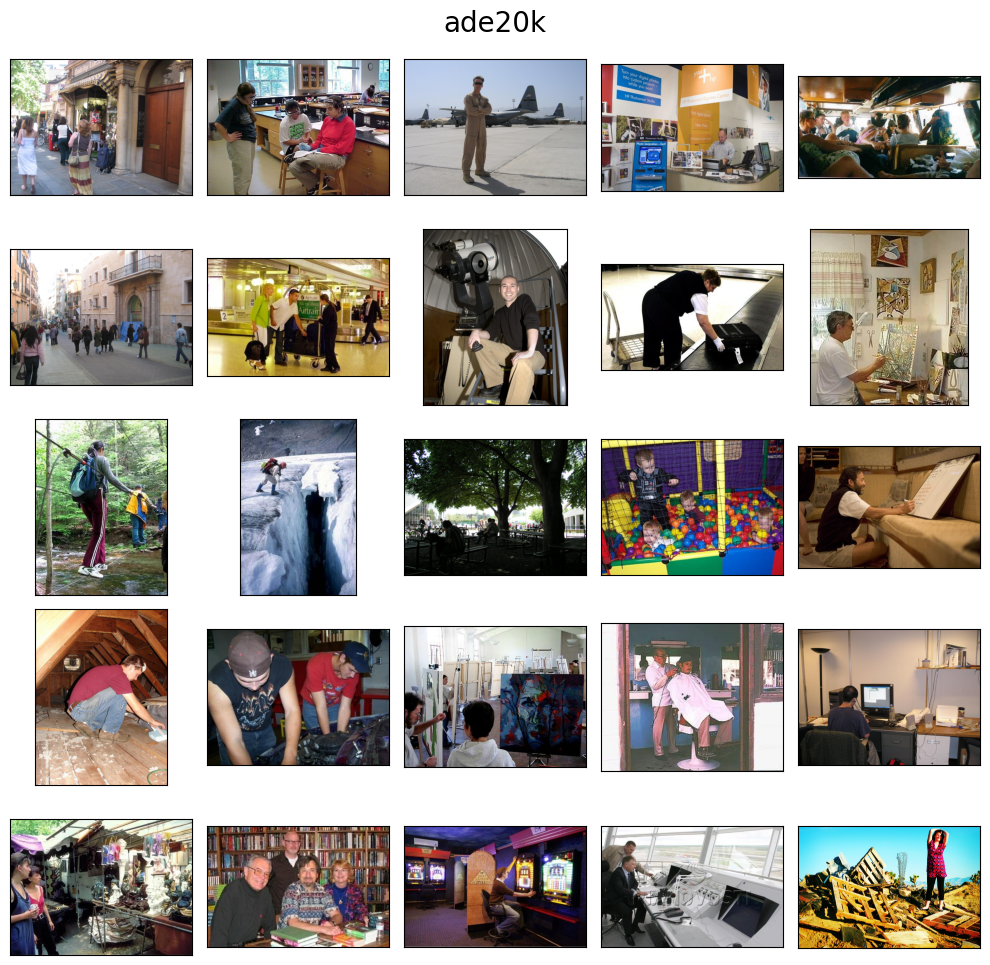

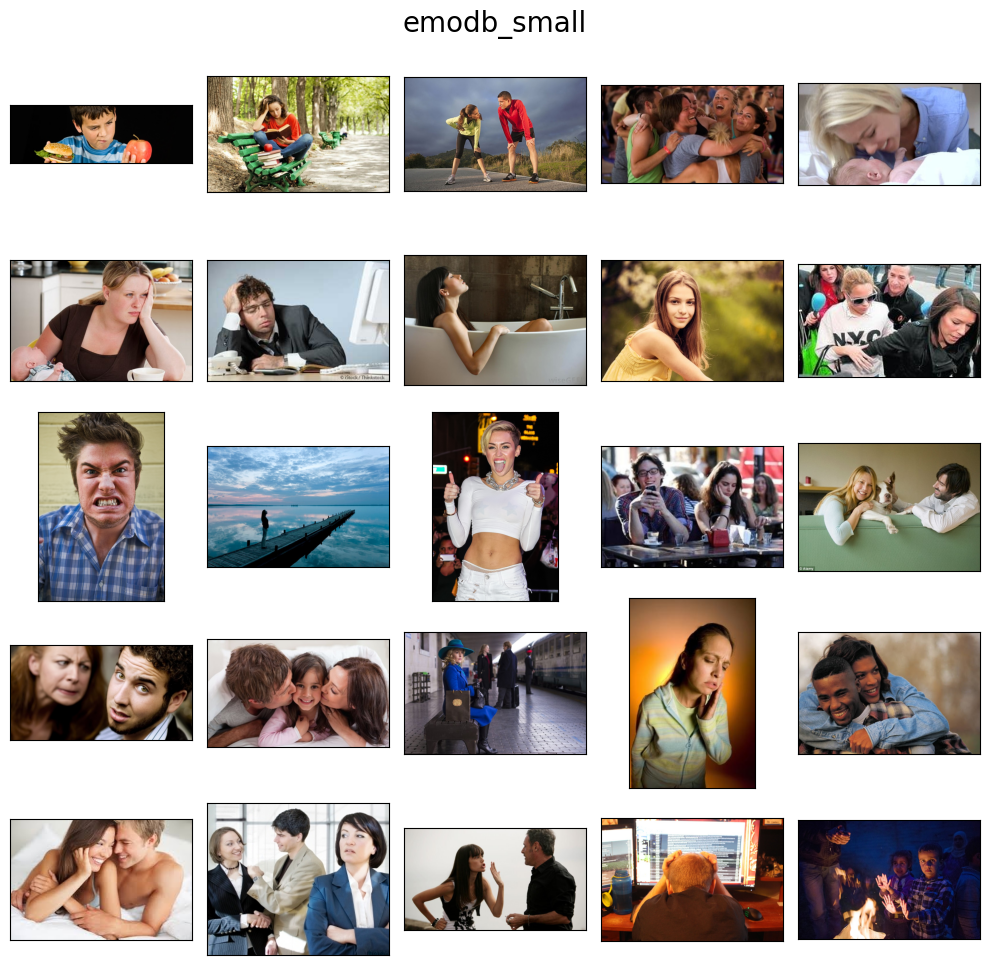

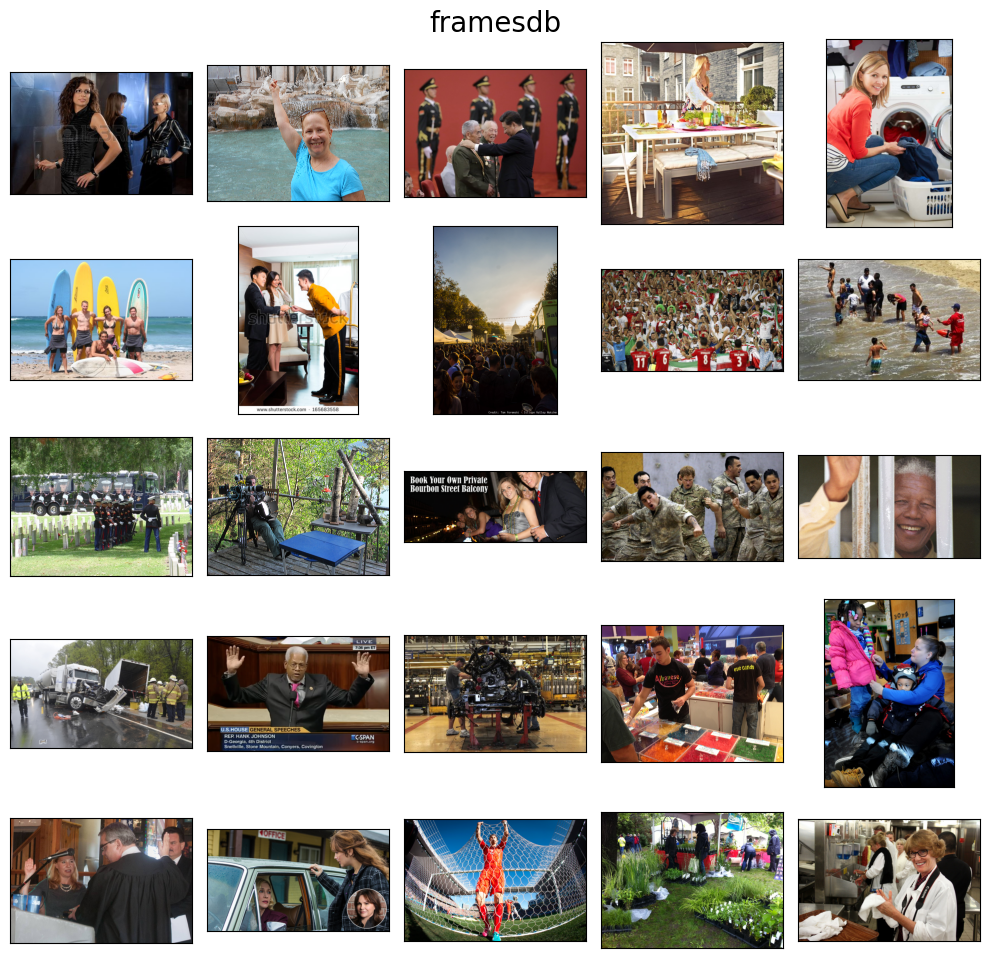

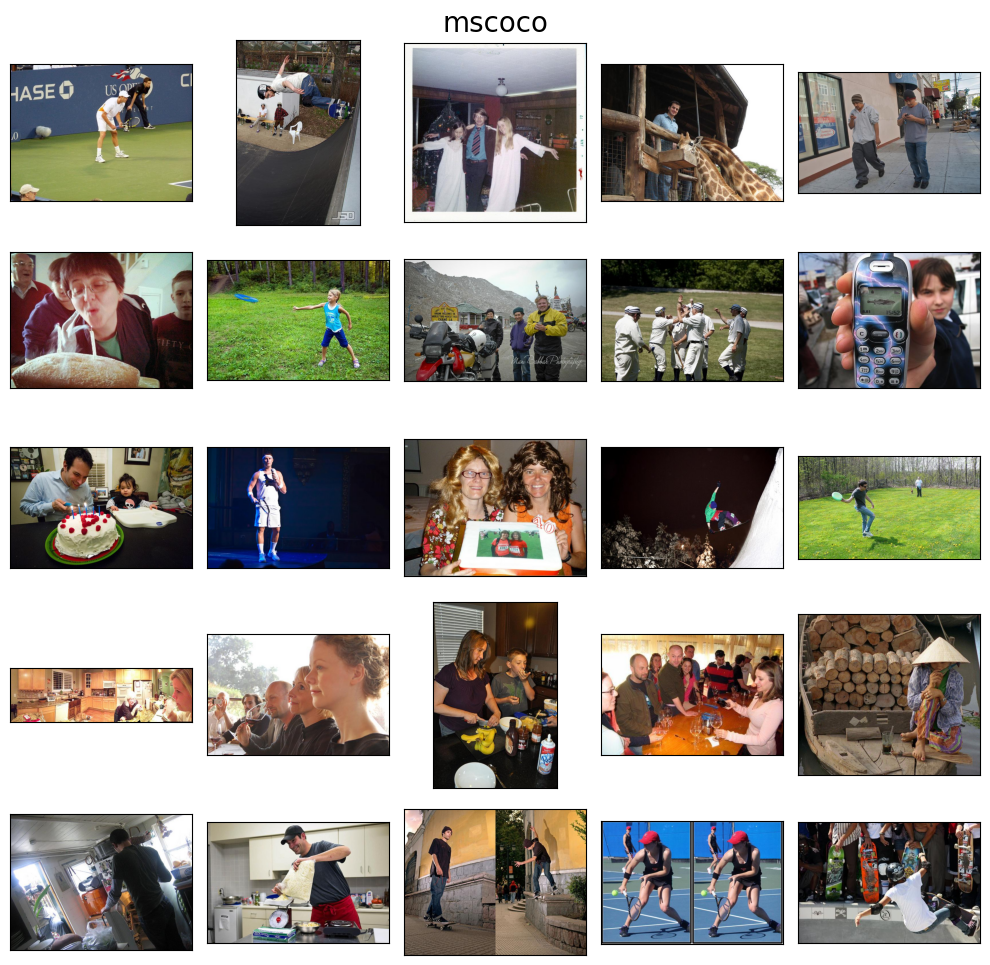

In [ ]:
grid_size = [5,5]
for orig_db in images_dict_origdb.keys():
    images = images_dict_origdb[orig_db]
    random_images = random.sample(images, grid_size[0]*grid_size[1])
    display_img_set (grid_size, random_images, title = orig_db)


We can observe that the COCO and Ade20k show more "in the wild" photos. The framesdb dataset shows many watermarks. The emodb_small dataset shows many "stock" alike photos, so the emotions or situations are a bit forced. 

### 4.2.Age and gender distribution:


In [ ]:
# Create a dictionary for each data split
origdb_dicts_gender = {db: {} for db in databases}
origdb_dicts_age = {db: {} for db in databases}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        for person in range(sample['people']):
            if sample['gender'][person] not in origdb_dicts_gender[original_db].keys():
                origdb_dicts_gender[original_db][sample['gender'][person]] = 1
            else:
                origdb_dicts_gender[original_db][sample['gender'][person]] += 1
            if sample['age'][person] not in origdb_dicts_age[original_db].keys():
                origdb_dicts_age[original_db][sample['age'][person]] = 1
            else:
                origdb_dicts_age[original_db][sample['age'][person]] += 1

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(data_split, gender, count) for data_split, gender_dict in origdb_dicts_gender.items() for gender, count in gender_dict.items()], columns=['Original db', 'Gender', 'Number of people'])
df2 = pd.DataFrame([(data_split, age, count) for data_split, age_dict in origdb_dicts_age.items() for age, count in age_dict.items()], columns=['Original db', 'Age', 'Number of people'])
# Divide by the total sum of values for each data split
df1['Number of people'] = df1.groupby('Original db')['Number of people'].transform(lambda x: x / x.sum())
df2['Number of people'] = df2.groupby('Original db')['Number of people'].transform(lambda x: x / x.sum())

In [ ]:
bar_chart_gender = alt.Chart(df1).mark_bar(color='orange', size=15).encode(
    x=alt.X('Gender:O', title='Gender',axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Number of people:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB',  header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'People`s gender distribution normalized by size of orig_db', fontSize=20, anchor='middle'),
    width = 100,
    height = 400
)

bar_chart_age = alt.Chart(df2).mark_bar(color='orange', size=15).encode(
    x=alt.X('Age:O', title='Age', axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Number of people:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB',  header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'People`s age distribution normalized by size of orig_db', fontSize=20, anchor='middle'),
    width = 100,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
age_gender_chart = (bar_chart_gender | bar_chart_age).resolve_scale(y='shared')

age_gender_chart

alt.HConcatChart(...)

We can observe that the distributions differ from one database to another. Regarding gender, the one with the highest difference between male and female persons is mscoco. In emodb small, is the only dataset where women have more entries. Regarding age, the one with the highest difference between adults and children is ade20k, with most entries being adult. On the other hand, emodb_small is the dataset with more kids in proportion.

### 4.3.Bbox distribution:
Now I will study the bbox distribution for each original dataset. First I will compute the metrics and then visualize it:

In [ ]:
# Create a dictionary for each original db
origdb_dicts_width = {db: [] for db in databases}
origdb_dicts_height = {db: [] for db in databases}
origdb_dicts_ratio = {db: [] for db in databases}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        for person in range(sample['people']):
            bbox = sample['bbox'][person]
            origdb_dicts_width[original_db].append(bbox[2]-bbox[0])
            origdb_dicts_height[original_db].append(bbox[3]-bbox[1])
            origdb_dicts_ratio[original_db].append((bbox[2]-bbox[0])/(bbox[3]-bbox[1])) # width/height



total_db_size = {db: len(vector) for db, vector in origdb_dicts_width.items()}

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(origdb, width, total_db_size[origdb]) for origdb, width_list in origdb_dicts_width.items() for width in width_list], columns=['Original db', 'Width', 'Totaldb_size'])
df2 = pd.DataFrame([(origdb, height, total_db_size[origdb]) for origdb, height_list in origdb_dicts_height.items() for height in height_list], columns=['Original db', 'Height', 'Totaldb_size'])

# Count the number of occurrences for each 'Width' and 'Original db'
df1['Count'] = df1.groupby(['Width', 'Original db'])['Width'].transform('count')
df2['Count'] = df2.groupby(['Height', 'Original db'])['Height'].transform('count')

# Drop duplicates:
df1 = df1.drop_duplicates()
df2 = df2.drop_duplicates()

# Divide the count by the total instances of each 'Original db'
df1['Proportion'] = df1['Count'] / df1['Totaldb_size']
df2['Proportion'] = df2['Count'] / df2['Totaldb_size']

Now I show the distribution of the bbox for each dataset:

In [ ]:
hist_width= alt.Chart(df1).mark_bar(color='orange').encode(
    x=alt.X('Width:Q', title='Width size (px)',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(0, max(df1['Width'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB', header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'Width distribution normalized by size of orig_db', fontSize=16, anchor='middle'),
    width = 300,
    height = 400
)

hist_height = alt.Chart(df2).mark_bar(color='orange').encode(
    x=alt.X('Height:Q', title='Height size (px)',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(0, max(df2['Height'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB', header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'Height distribution normalized by size of orig_db', fontSize=16, anchor='middle'),
    width = 300,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
width_height_chart = alt.vconcat(hist_width, hist_height).resolve_scale(y='shared', x = 'shared')

width_height_chart. properties(
    title = alt.TitleParams(text = 'Distribution of image`s width and height per each original database normalized by the size of it', fontSize=20, anchor='middle', dy = -20),
)

alt.VConcatChart(...)

We can observe that in general all distributions are heavily weighted towards 0. This is expected, as many bbox are from small photos. This is the case for ade20k and mscoco datasets. For the emodb_small and framesdb datasetm we can see that there is a tail along the x axis, this is because the bbox are bigger as the images are bigger, reaching up to 4.000 px.

Now I will check the ratio of image:

In [ ]:
# Convert dictionary to pandas DataFrames
df1 = pd.DataFrame([(origdb, ratio, total_db_size[origdb]) for origdb, ratio_list in origdb_dicts_ratio.items() for ratio in ratio_list], columns=['Original db', 'Ratio', 'Totaldb_size'])
# Count the number of occurrences for each 'Width' and 'Original db'
df1['Count'] = df1.groupby(['Ratio', 'Original db'])['Ratio'].transform('count')
# Drop duplicates:
df1 = df1.drop_duplicates()
# Divide the count by the total instances of each 'Original db'
df1['Proportion'] = df1['Count'] / df1['Totaldb_size']

In [ ]:
hist_ratio= alt.Chart(df1).mark_bar(color='orange').encode(
    x=alt.X('Ratio:Q', title='Ratio width/height (log-scale)',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(0, max(df1['Ratio'])))).scale(type="log"),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB', header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'Bbox ratio (width/heigth) distribution normalized by size of orig_db', fontSize=20, anchor='middle', dy = -20),
    width = 300,
    height = 400
)

hist_ratio

alt.Chart(...)

We take the same approach as the section 2.3, and apply the log-scale to see better the 1:1 ratio and see if bbox are in general vertical or horizontal. In general, we can observe a similar distribution, more heavy weighted towards the vertical bbox. But we can observe that the emodb_small dataset has a more balanced distribution. Regarding framesdb, we can observe that the distribution mostly vertical, having a spike around 0.5 (1:2) bigger than 1:1, that is the case for all orher distributions.

### 4.4.Categorical annotations distribution on original databases

Know I will analyze the categorical emotion distribution for each original database. First I will compute the metrics and then visualize it using a histogram:

In [ ]:
origdb_dicts_cat_annot = {db: {} for db in databases}

for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].loc[photo_idx]
        original_db = sample['orig_db']
        for person in range(sample['people']):
            emotions = sample["label_cat"][person]
            for emotion in emotions:
                if emotion != 'NA':
                    if emotion not in origdb_dicts_cat_annot[original_db].keys():
                        origdb_dicts_cat_annot[original_db][emotion] = 1
                    else:
                        origdb_dicts_cat_annot[original_db][emotion] += 1

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(orig_db, emotion, count) for orig_db, emotion_dict in origdb_dicts_cat_annot.items() for emotion, count in emotion_dict.items()], columns=['Original_db', 'Emotion', 'Number of people'])

# Divide by the total sum of values for each data split
df1['Number of people'] = df1.groupby('Original_db')['Number of people'].transform(lambda x: x / x.sum())

In [ ]:
# Get unique 'Data_split' values
orig_db = df1['Original_db'].unique()

# Create a chart for each 'Data_split' value and store them in a list
charts = []
for db in orig_db:
    chart = alt.Chart(df1[df1['Original_db'] == db]).mark_bar(color='orange', size=15).encode(
        x=alt.X('Emotion:O', title='Categorical Emotion', axis=alt.Axis(labelAngle=-45, labels=True)),
        y=alt.Y('Number of people:Q', title='Proportion of people')
    ).properties(
        title = alt.TitleParams(text = f"Original DB: {db}", fontSize=16, anchor = 'middle'),
        width = 800,
        height = 300
    )
    charts.append(chart)

# Concatenate the charts vertically
histogram_cat_annot = alt.vconcat(*charts).resolve_scale(y='shared')
histogram_cat_annot.properties(
    title = alt.TitleParams(text = 'People`s categorical emotions annotations distribution normalized by size of datasplit', fontSize=20, anchor = 'middle', dy = -30),
)

alt.VConcatChart(...)

We can observe that the distributions are not uniform, except for emodb_small, that has the weight more distributed. In mscoco almost 0.2 of the entries are engagement. This is important to take into account when training the model, as it could be biased towards the most common emotions.

### 4.5.Categorical annotations distribution on original databases

In [ ]:
# Create a dictionary for each original db
origdb_dicts_valence = {db: [] for db in databases}
origdb_dicts_arousal = {db: [] for db in databases}
origdb_dicts_dominance = {db: [] for db in databases}
for data_split in annotations.keys():
    for photo_idx in range(len(annotations[data_split])):
        sample = annotations[data_split].iloc[photo_idx]
        for person in range (sample['people']):
            origdb_dicts_valence[sample['orig_db']].append(sample["label_cont"][person][0])
            origdb_dicts_arousal[sample['orig_db']].append(sample["label_cont"][person][1])
            origdb_dicts_dominance[sample['orig_db']].append(sample["label_cont"][person][2])

total_db_size = {db: len(vector) for db, vector in origdb_dicts_valence.items()}

# Convert dictionaries to pandas DataFrames
df1 = pd.DataFrame([(origdb, valence, total_db_size[origdb]) for origdb, valence_list in origdb_dicts_valence.items() for valence in valence_list], columns=['Original db', 'Valence', 'Totaldb_size'])
df2 = pd.DataFrame([(origdb, arousal, total_db_size[origdb]) for origdb, arousal_list in origdb_dicts_arousal.items() for arousal in arousal_list], columns=['Original db', 'Arousal', 'Totaldb_size'])
df3 = pd.DataFrame([(origdb, dominance, total_db_size[origdb]) for origdb, dominance_list in origdb_dicts_dominance.items() for dominance in dominance_list], columns=['Original db', 'Dominance', 'Totaldb_size'])

# Count the number of occurrences for each 'Width' and 'Original db'
df1['Count'] = df1.groupby(['Valence', 'Original db'])['Valence'].transform('count')
df2['Count'] = df2.groupby(['Arousal', 'Original db'])['Arousal'].transform('count')
df3['Count'] = df3.groupby(['Dominance', 'Original db'])['Dominance'].transform('count')

# Drop duplicates:
df1 = df1.drop_duplicates()
df2 = df2.drop_duplicates()
df3 = df3.drop_duplicates()

# Divide the count by the total instances of each 'Original db'
df1['Proportion'] = df1['Count'] / df1['Totaldb_size']
df2['Proportion'] = df2['Count'] / df2['Totaldb_size']
df3['Proportion'] = df3['Count'] / df3['Totaldb_size']

In [ ]:
hist_valence= alt.Chart(df1).mark_bar(color='orange', width= 20).encode(
    x=alt.X('Valence:Q', title='Valence value',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(min(df1['Valence']), max(df1['Valence'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB', header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'Valence distribution', fontSize=18, anchor='middle'),
    width = 300,
    height = 400
)

hist_arousal = alt.Chart(df2).mark_bar(color='orange', width= 20).encode(
    x=alt.X('Arousal:Q', title='Arousal value',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(min(df2['Arousal']), max(df2['Arousal'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB', header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'Arousal distribution', fontSize=18, anchor='middle'),
    width = 300,
    height = 400
)

hist_dominance = alt.Chart(df3).mark_bar(color='orange', width= 20).encode(
    x=alt.X('Dominance:Q', title='Dominance value',axis=alt.Axis(labelAngle=0), scale=alt.Scale(domain=(min(df3['Dominance']), max(df3['Dominance'])))),
    y=alt.Y('Proportion:Q', title='Proportion of people'),
    column=alt.Column('Original db:N', title='Original DB', header=alt.Header(titleFontSize=14, labelFontSize=12))
).properties(
    title = alt.TitleParams(text = 'Dominance distribution', fontSize=18, anchor='middle'),
    width = 300,
    height = 400
)

# Combine the two charts horizontally and share the same y-axis
orig_db_contlabel_dist = alt.vconcat(hist_valence, hist_arousal, hist_dominance).resolve_scale(y='shared', x = 'shared')

orig_db_contlabel_dist.properties(
    title = alt.TitleParams(text = 'Distribution of continuous labels per each originial db normalized by size of it', fontSize=20, anchor='middle', dy = -30),
)

alt.VConcatChart(...)

We can observe that the emodb_small is the database having more weight distributed. Regarding the other databases, they are more or less similar one to another with slight differences but following the general distribution pattern. The ade20k is the one with the most centered mass. 

# 5.Conclusions on data exploration

After the long data exploration on the emotic PAMI 2019, I have concluded the following:

1. For the categorical emotions labels some label weighting or data augmentation techniques should be done as there the label distribution is unbalanced. It can observed that there are 5000 people that is labeled only as engagement, so we will need to see if this is a problem when training the model.
2. For the continuous emotions labels most labels are centered around the middle of the range, so the model will be more biased to predict the annotations in the middle of the range than the annotations in the extremes.
3. Gender and age distributions are unbalanced (mostly age). So the model it is expected to have better predictions on adult mans (and a slightly worse on adult women). 
4. The bbox distribution is heavily weighted towards 0 to 1000 px, but few above that threshold. This is needed to keep in mind when choosing the model input size and be able to fit most images without making any distortion over them.
5. Also the ratio of train, validation and test are unusual. When training the model and doing the hyperparameter optimization this is needed to keep in mind if I follow this structure. 
6. This dataset cannot be used to train the bbox regressor, as not all people are not annotated.

So after all this, I decided to do the following for the data preprocessing and training:
1. Do some downscaling of the images or erase the images that are above the 1000px threshold of bbox.
2. Do some data augmentation or label weighting techniques to balance the categorical labels.
3. Take only the `mscoco`, `emodb_small` and `ade20k` dataset. `Mscoco` is the biggest dataset and it comes from the well studied photos. Even thought the labels are not well distributed, it will help the model to see more "in the wild" cases. `Emodb_small` showed a better distributed labelling and, even though many of its photos are a bit unreal emotions, it will help the model to see more rare cases. `Ade20k` is the smallest dataset, but it has almost the same distribution of labels as `mscoco` and it will help the model to see more "in the wild" cases. 
`Framesdb` didn't show astonishing annotation distributions and it's photos are not as well studied as mscoco (many of them include watermarks). Also it has a lot of NA values, incorrect annotations so this lead me to untrust the annotations present in this dataset. So i decided to discard it.
4. I will ignore the data splits and I will introduce all this data to other data splits following a 33-33-33 ratio.
5. Perform an image normalization to have a similar mean color across all the images.